# Setup

In [1]:
import os
import sys
from pathlib import Path

from fjsspw_solver.genetic_algorithm import MethodParams

# sys.path.append(str(Path(__file__).parent.parent / 'src'))

from pathlib import Path

from fjsspw_solver import GeneticAlgorithm, Individual, Encoding, GAParams
from fjsspw_solver.plotting import plot_fjsspw_gantt, plot_learning_progress, PlottingParams,plot_multiple_instance_runs
from fjsspw_solver.utils import get_next_filename

from util.benchmark_parser import WorkerBenchmarkParser

from constants import *

from pprint import pprint
from time import perf_counter

from tqdm import tqdm

In [2]:
parser = WorkerBenchmarkParser()
instance_name = 'Behnke30'
instance_path = INSTANCE_FJSSPW_PATH / f'{instance_name}.fjs'
encoding = parser.parse_benchmark(str(instance_path))

encoding = Encoding(encoding.durations().tolist(), encoding.job_sequence())

print("-" * 20)
print("Encoding info")
print("n_operations:", encoding.n_operations())
print("n_machines:", encoding.n_machines())
print("n_workers:", encoding.n_workers())
print("n_jobs:", encoding.n_jobs())
print("-" * 20)

--------------------
Encoding info
n_operations: 100
n_machines: 40
n_workers: 60
n_jobs: 20
--------------------


In [3]:
def run_ga(params: GAParams, prints: bool = True):
    ga = GeneticAlgorithm(params, encoding, True)
    
    start = perf_counter()
    ga.run_optimization()
    end = perf_counter()

    best = ga.get_all_time_best_indv()
    if prints:
        print(f"Optimization took {end-start:.4f} seconds")
        print(f"Best fitness = {best}")
    return best

In [4]:
def experiment(params: GAParams, N):
    plotting_params = PlottingParams(
        instance_name = instance_name,
        bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
        selection_type = "Tournament",
        crossover_type = "MOX",
        mutation_type = "Adaptive",
        selection_size = params.selection_size,
        crossover_prob = params.crossover_prob,
        mutation_prob = params.mutation_prob,
        generations = params.generations,
        population_size = params.population_size,
    )
    
    runs = []
    best_run = (None, None, None)

    log_dir = params.log_directory
    log_base_name = params.log_name
    log_output_name = params.log_output_name

    for i in tqdm(range(N)):
        log_file_i = get_next_filename(log_base_name, folder=log_dir, extension="csv")
        log_output_file_i = get_next_filename(log_output_name, folder=log_dir, extension="out")
        params.log_directory = log_dir
        params.log_name = log_file_i.name.__str__()
        params.log_output_name = log_output_file_i.name.__str__()
        best = run_ga(params, prints=False)
        runs.append((best, None, log_file_i))
        best_run = (best, log_file_i, log_output_file_i) if best_run[0] is None or best_run[0] > best else best_run

    plot_multiple_instance_runs(plotting_params, runs, zoom=True)

    best_fit, best_log, best_output = best_run
    if not best_output is None: 
        with open(best_output, mode='r') as f:
            fitness = float(f.readline())
            assert fitness == best_fit, "Best fit from log is not equal to output"
            sequence = [int(x) for x in f.readline().split(',')]
            machines = [int(x) for x in f.readline().split(',')]
            workers = [int(x) for x in f.readline().split(',')]
            start_times = [float(x) for x in f.readline().split(',')]
            end_times = [float(x) for x in f.readline().split(',')]
        plot_fjsspw_gantt(sequence, machines, workers, start_times, end_times, encoding, instance_name, fitness)

# Experiments

In [4]:
log_file = get_next_filename("method_py", folder="logs")
generations = 2000
population_size = 100
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.02
remove_clones = False

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

 40%|████      | 6/15 [00:16<00:25,  2.81s/it]


KeyboardInterrupt: 

In [ ]:
# plot_learning_progress(log_file, plotting_params, zoom=False, show_title=True)
# plot_learning_progress(log_file, plotting_params, zoom=True, show_title=True)

100%|██████████| 15/15 [01:06<00:00,  4.41s/it]


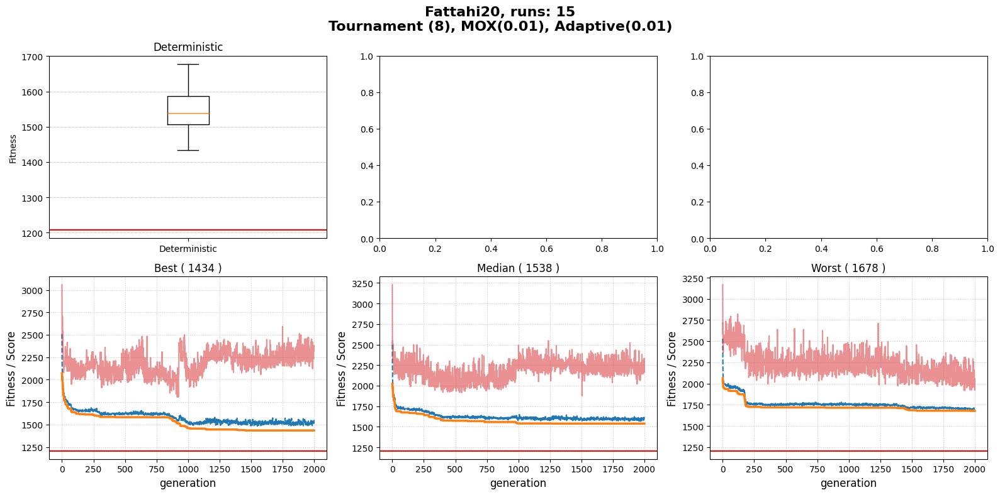

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 2000
population_size = 200
selection_size = 8
crossover_prob = 0.01
mutation_prob = 0.01
remove_clones = False

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

100%|██████████| 15/15 [00:28<00:00,  1.89s/it]


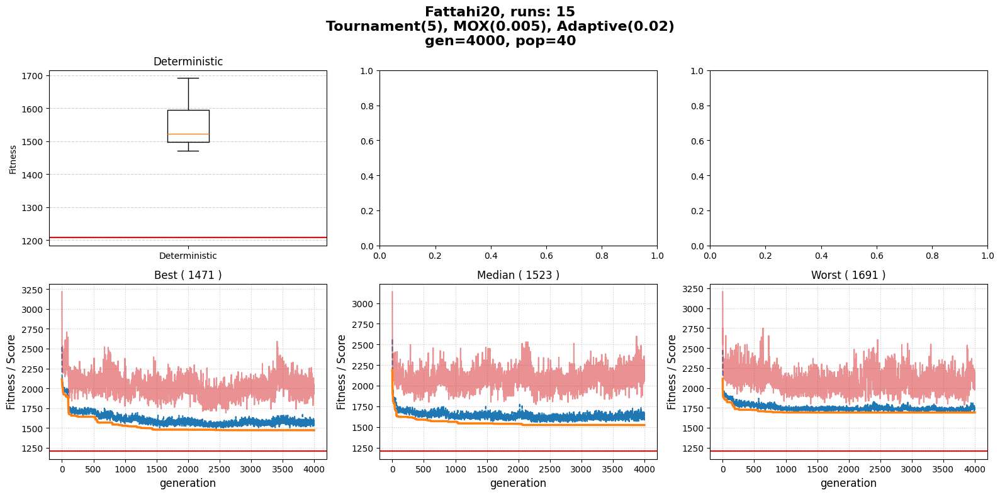

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 4000
population_size = 40
selection_size = 5
crossover_prob = 0.005
mutation_prob = 0.02
remove_clones = False

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

100%|██████████| 15/15 [00:24<00:00,  1.61s/it]


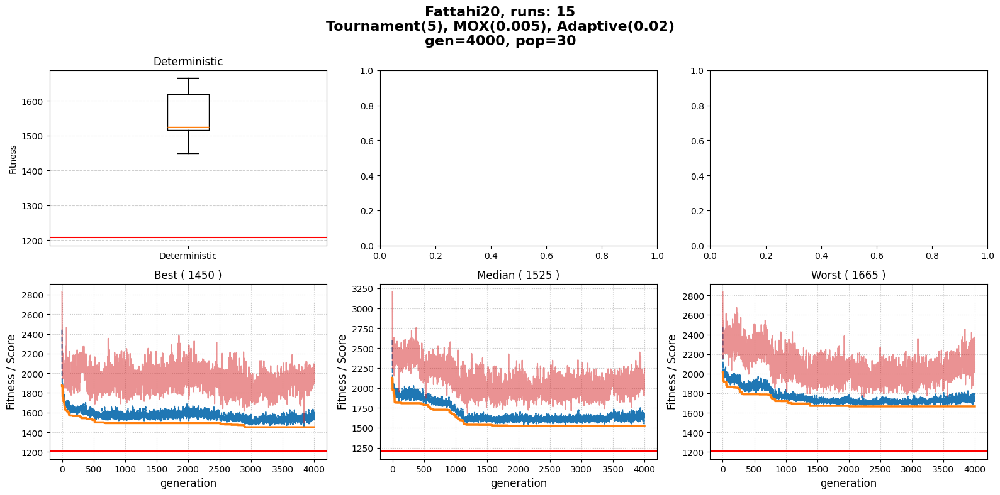

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 4000
population_size = 30
selection_size = 5
crossover_prob = 0.005
mutation_prob = 0.02
remove_clones = False

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


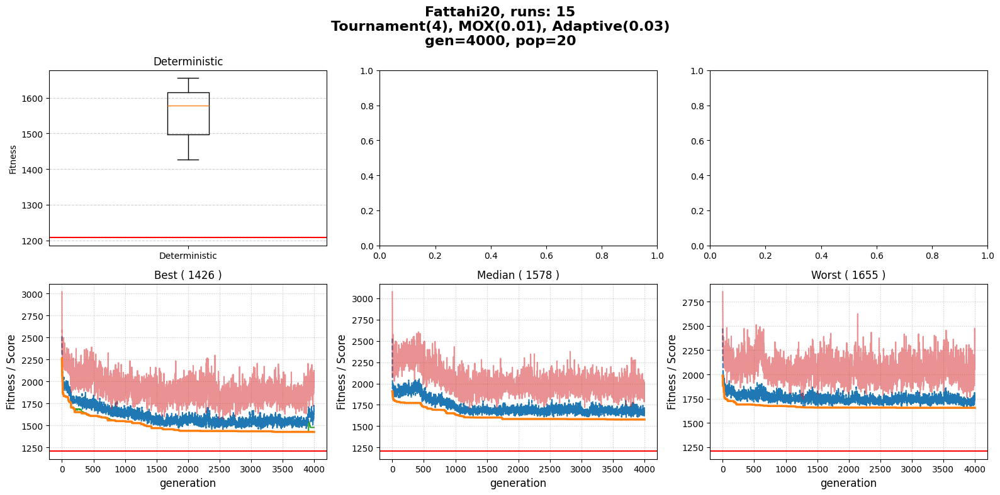

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 4000
population_size = 20
selection_size = 4
crossover_prob = 0.01
mutation_prob = 0.03
remove_clones = False

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


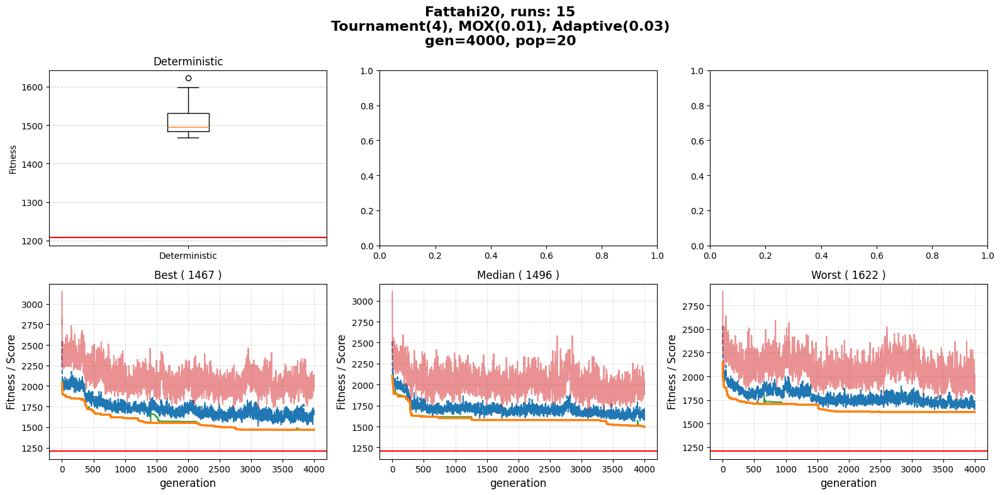

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 4000
population_size = 20
selection_size = 4
crossover_prob = 0.01
mutation_prob = 0.03
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs)

100%|██████████| 15/15 [00:32<00:00,  2.15s/it]


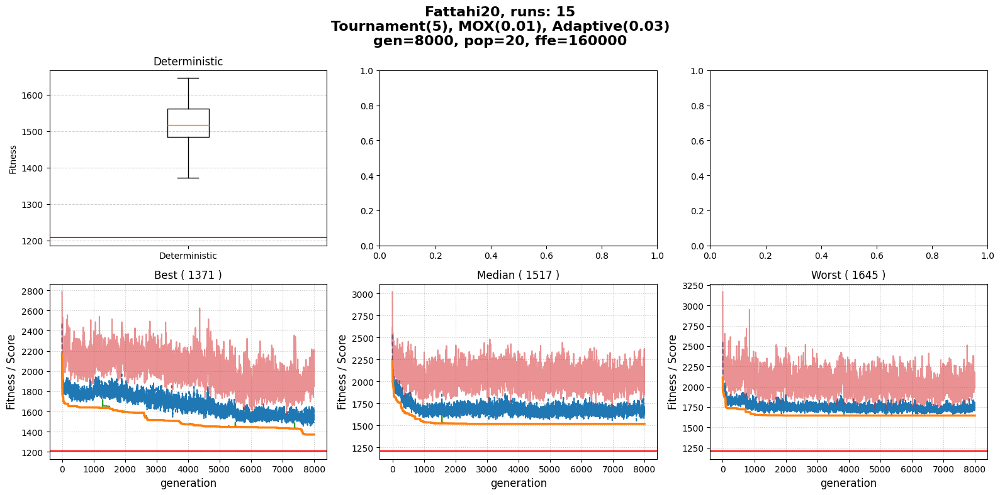

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 8000
population_size = 20
selection_size = 5
crossover_prob = 0.01
mutation_prob = 0.03
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 15/15 [00:31<00:00,  2.13s/it]


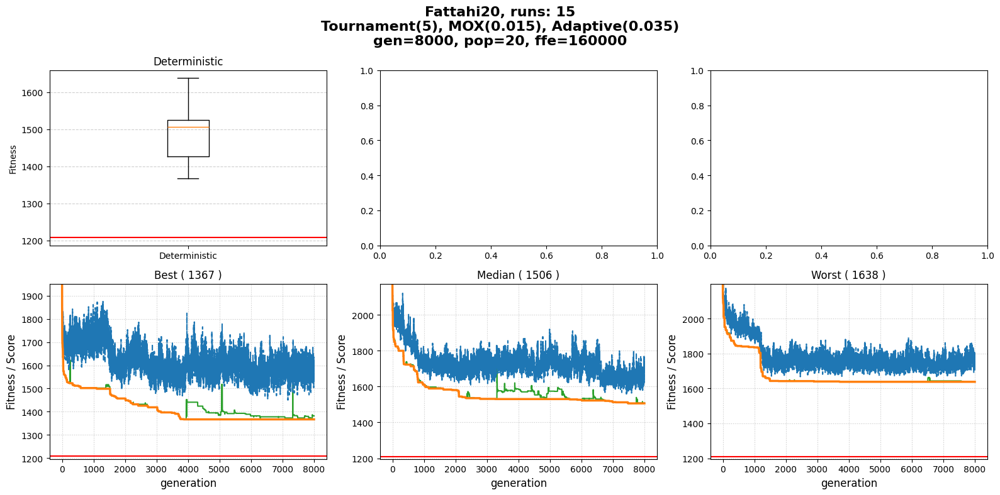

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 8000
population_size = 20
selection_size = 5
crossover_prob = 0.015
mutation_prob = 0.035
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 15/15 [01:18<00:00,  5.23s/it]


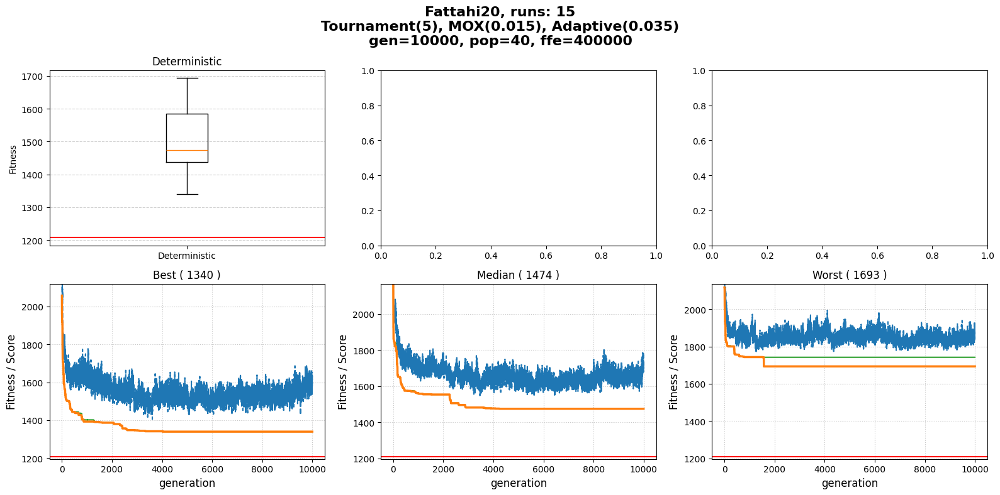

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 10000
population_size = 40
selection_size = 5
crossover_prob = 0.015
mutation_prob = 0.035
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 15

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 25/25 [02:57<00:00,  7.12s/it]


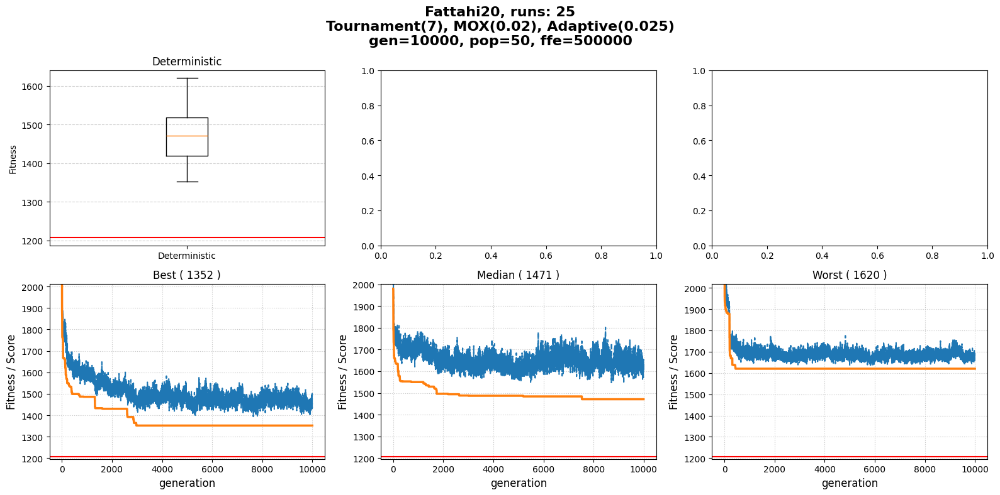

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 10000
population_size = 50
selection_size = 7
crossover_prob = 0.02
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 25

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 10/10 [01:07<00:00,  6.74s/it]


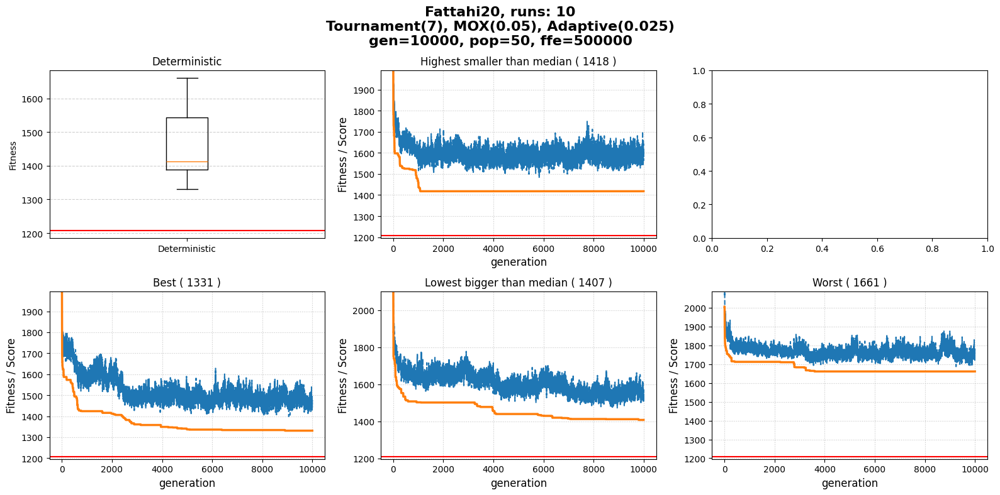

: 

In [ ]:
log_file = get_next_filename("method_py", folder="logs")
generations = 10000
population_size = 50
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 10

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 2/2 [00:10<00:00,  5.30s/it]


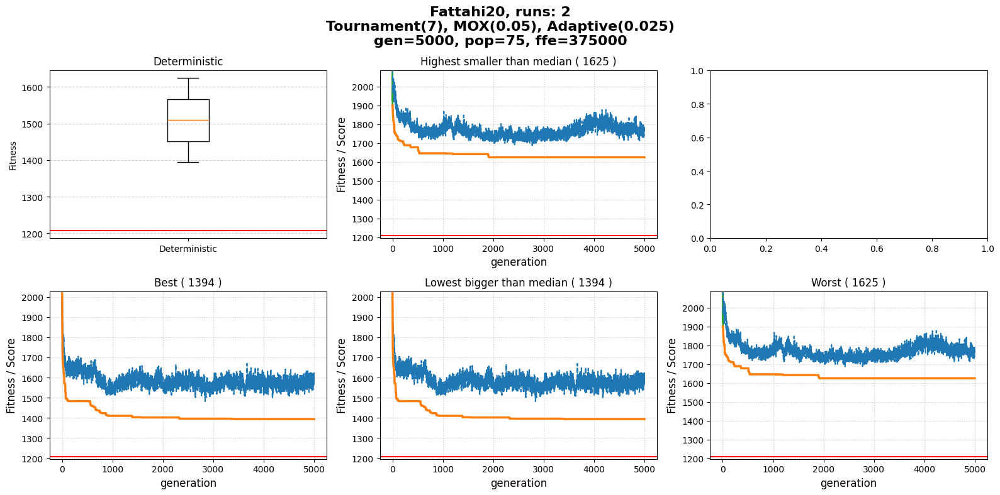

In [4]:
log_file = get_next_filename("method_py", folder="logs")
generations = 5000
population_size = 75
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 2

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 2/2 [00:19<00:00,  9.87s/it]


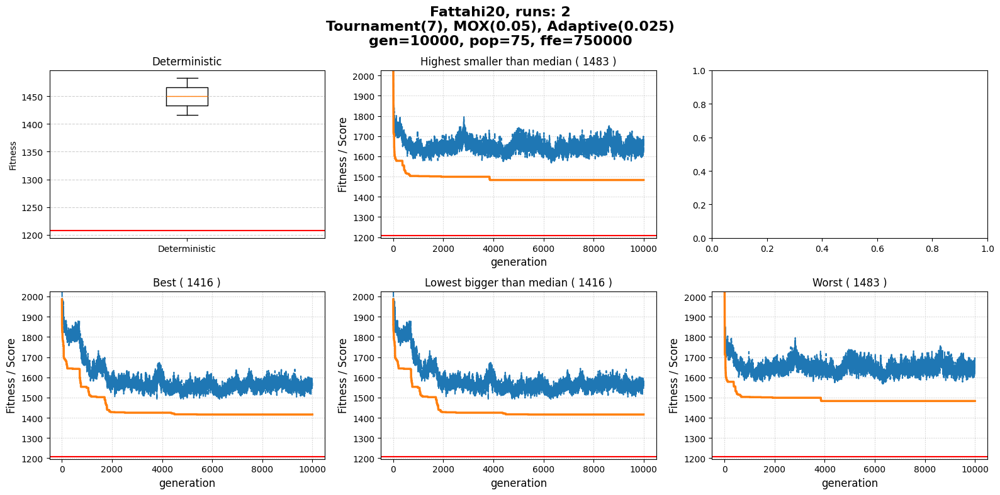

In [5]:
log_file = get_next_filename("method_py", folder="logs")
generations = 10000
population_size = 75
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 2

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 2/2 [00:40<00:00, 20.45s/it]


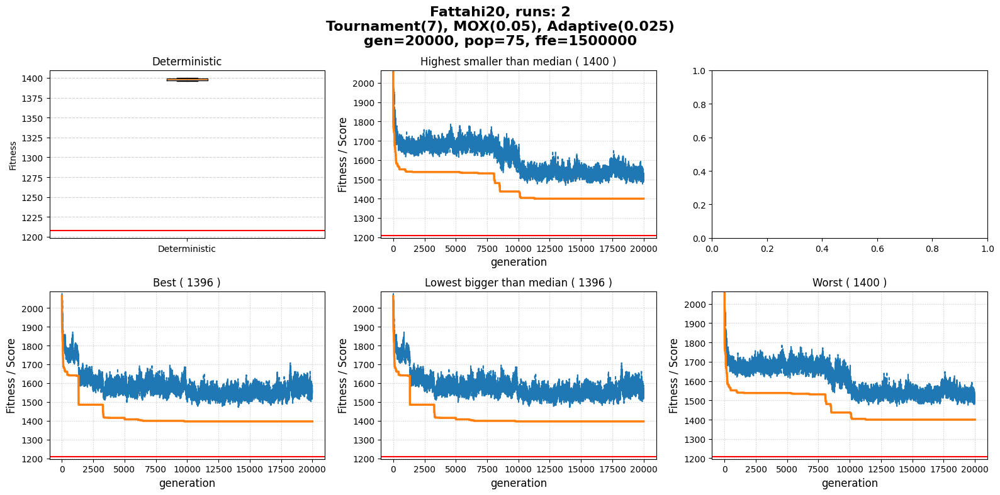

In [6]:
log_file = get_next_filename("method_py", folder="logs")
generations = 20000
population_size = 75
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 2

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 2/2 [02:22<00:00, 71.06s/it]


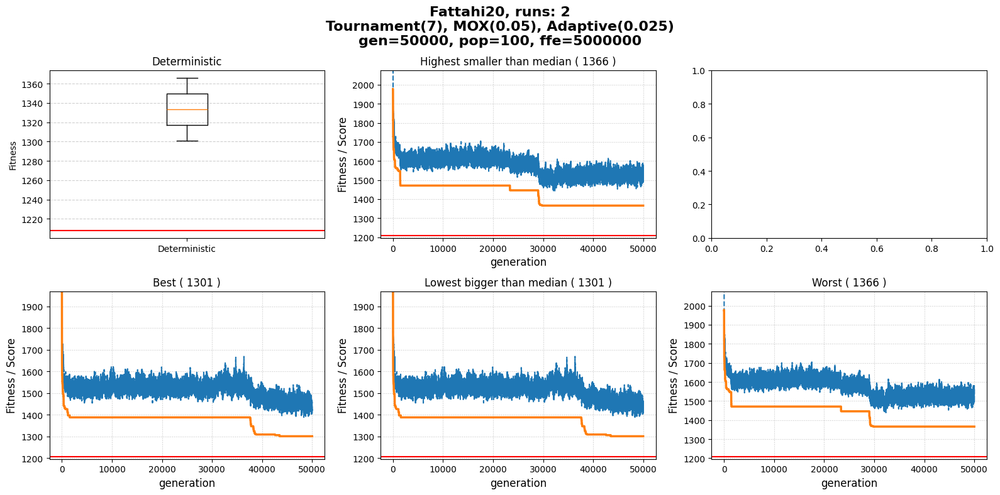

In [7]:
log_file = get_next_filename("method_py", folder="logs")
generations = 50000
population_size = 100
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 2

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

  0%|          | 0/3 [00:00<?, ?it/s]

100%|██████████| 3/3 [03:25<00:00, 68.43s/it]


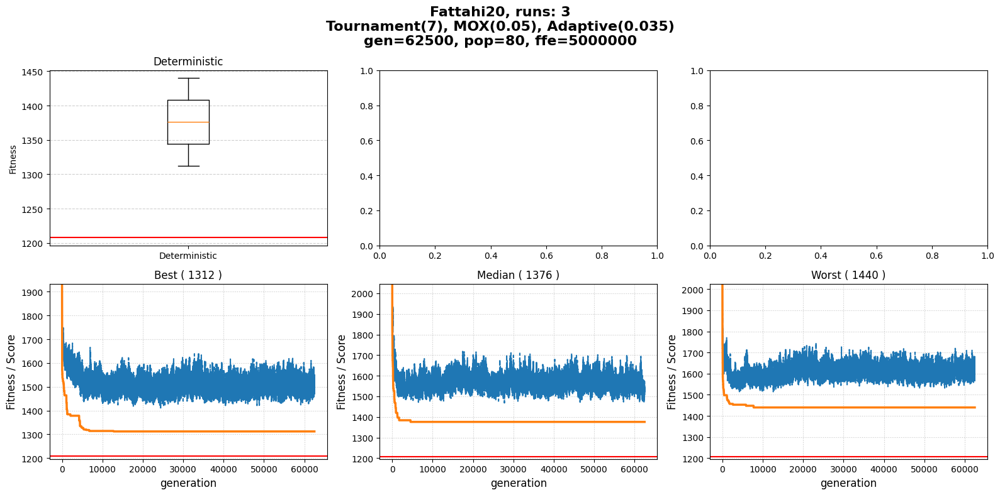

In [4]:
log_file = get_next_filename("method_py", folder="logs")
generations = 62500
population_size = 80
selection_size = 7
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

os.makedirs(log_file.parent, exist_ok=True)

params = GAParams(
    log_file.__str__(),
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 3

runs = []

for i in tqdm(range(N)):
    log_file_i = get_next_filename("method_py", folder="logs")
    params.log_path = log_file_i.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

100%|██████████| 2/2 [00:00<00:00, 11.55it/s]


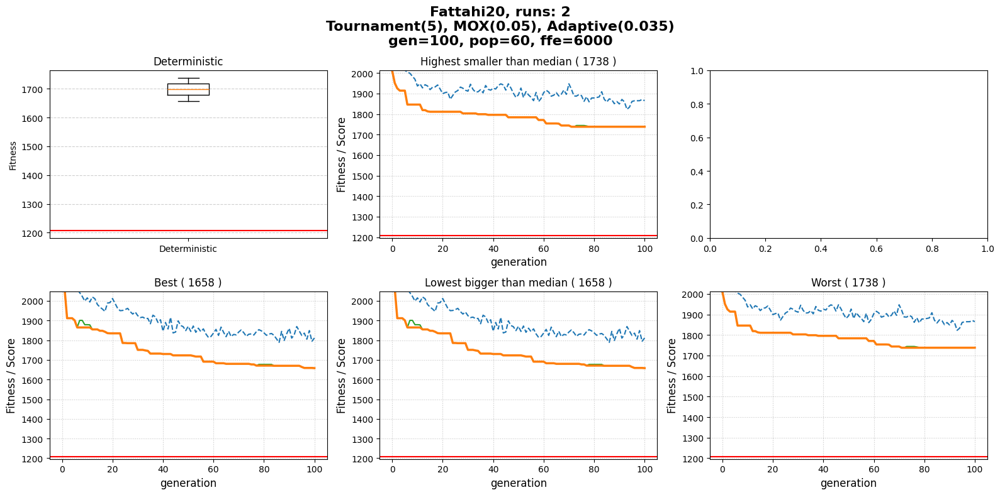

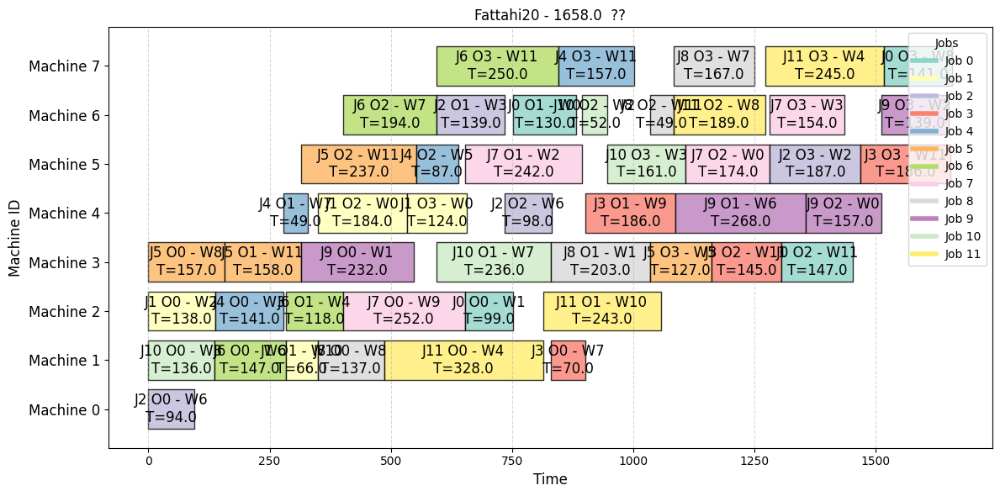

In [6]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
# generations = 62500
generations = 100
population_size = 60
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

plotting_params = PlottingParams(
    instance_name = instance_name,
    bounds_file = "../../instances/InstanceData/FJSSP-W/best_known.csv",
    selection_type = "Tournament",
    crossover_type = "MOX",
    mutation_type = "Adaptive",
    selection_size = selection_size,
    crossover_prob = crossover_prob,
    mutation_prob = mutation_prob,
    generations=generations,
    population_size=population_size,
)

N = 2

runs = []
best_run = (None, None, None)

for i in tqdm(range(N)):
    log_file_i = get_next_filename(log_base_name, folder=log_dir, extension="csv")
    log_output_file_i = get_next_filename(log_output_name, folder=log_dir, extension="out")
    params.log_directory = log_dir
    params.log_name = log_file_i.name.__str__()
    params.log_output_name = log_output_file_i.name.__str__()
    best = run_ga(params, prints=False)
    runs.append((best, None, log_file_i))
    best_run = (best, log_file_i, log_output_file_i) if best_run[0] is None or best_run[0] > best else best_run

plot_multiple_instance_runs(plotting_params, runs, zoom=True)

best_fit, best_log, best_output = best_run
if not best_output is None: 
    with open(best_output, mode='r') as f:
        fitness = float(f.readline())
        assert fitness == best_fit, "Best fit from log is not equal to output"
        sequence = [int(x) for x in f.readline().split(',')]
        machines = [int(x) for x in f.readline().split(',')]
        workers = [int(x) for x in f.readline().split(',')]
        start_times = [float(x) for x in f.readline().split(',')]
        end_times = [float(x) for x in f.readline().split(',')]
    plot_fjsspw_gantt(sequence, machines, workers, start_times, end_times, encoding, instance_name, fitness)

100%|██████████| 2/2 [01:41<00:00, 50.67s/it]


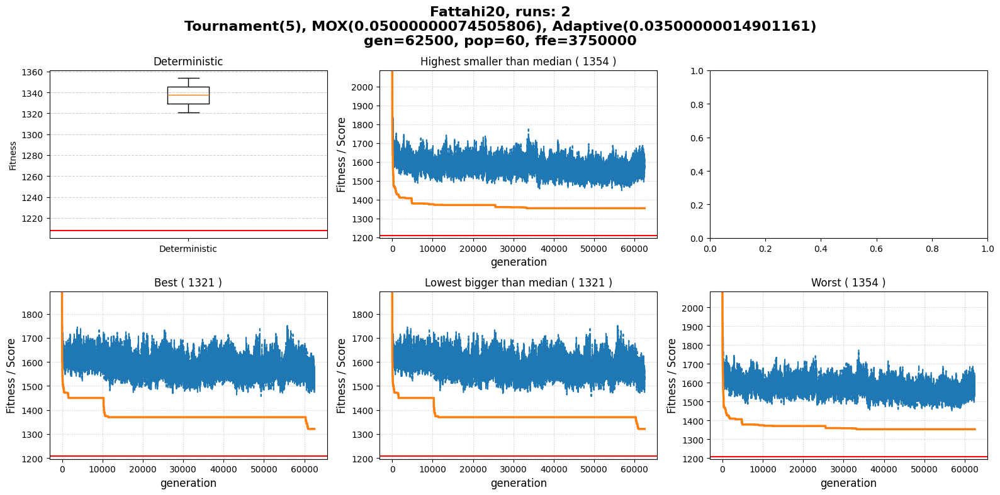

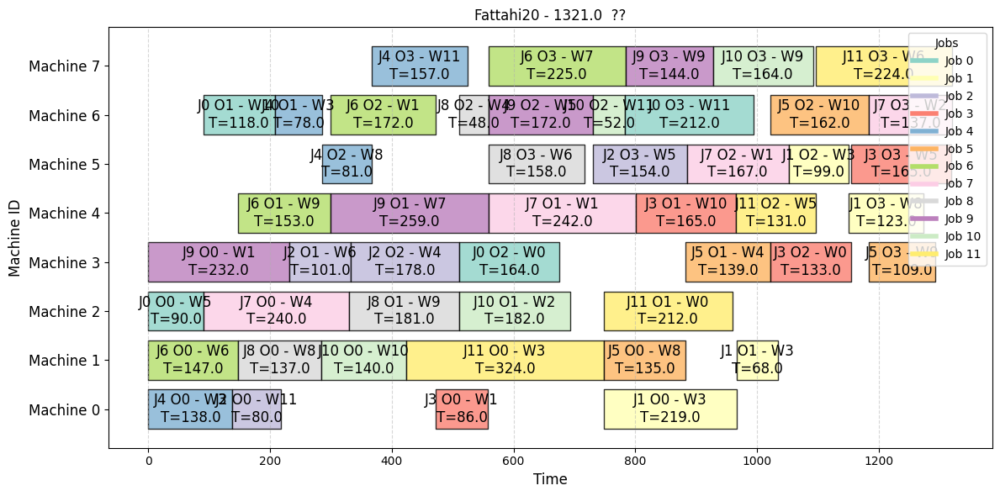

In [ ]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 62500
population_size = 60
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

experiment(params, N=2)

100%|██████████| 5/5 [05:33<00:00, 66.76s/it]


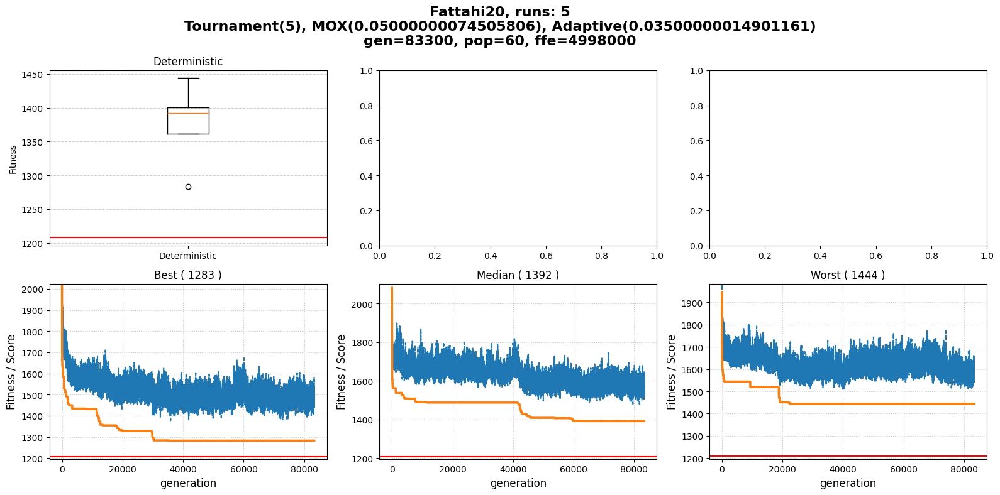

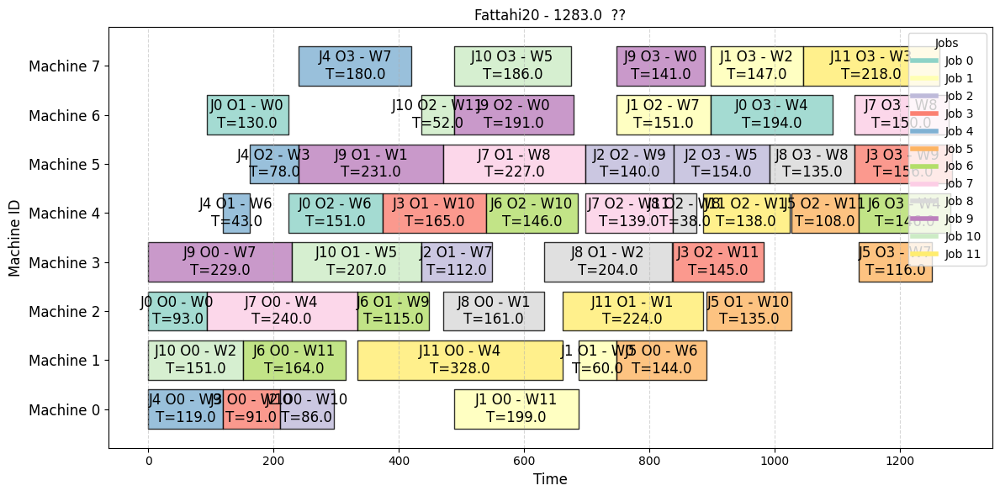

In [ ]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 83300
population_size = 60
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 5

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

experiment(params, N=N)

100%|██████████| 5/5 [05:40<00:00, 68.01s/it]


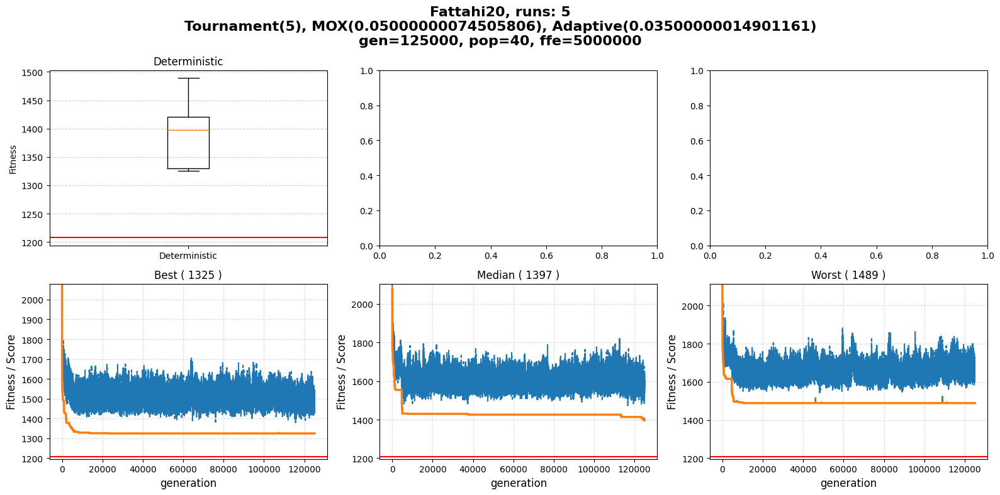

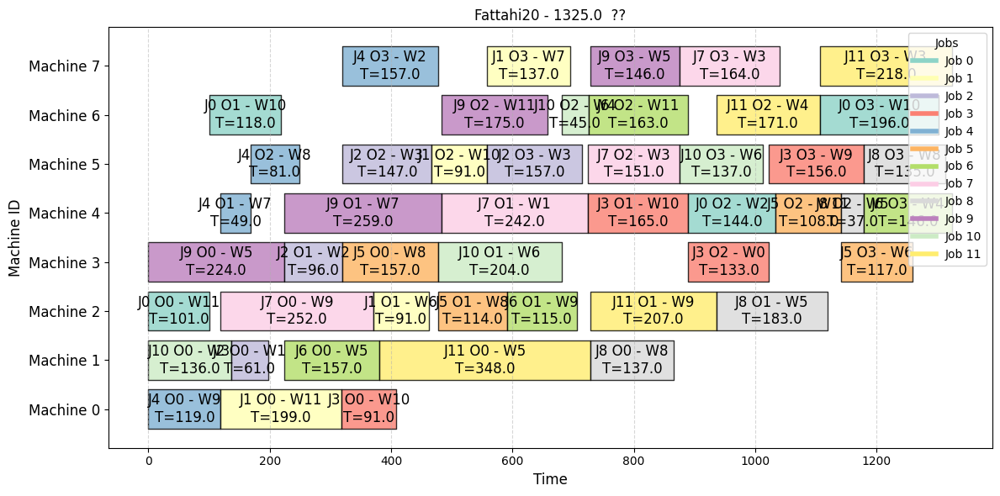

In [11]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 5

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

experiment(params, N=N)

100%|██████████| 5/5 [05:31<00:00, 66.38s/it]


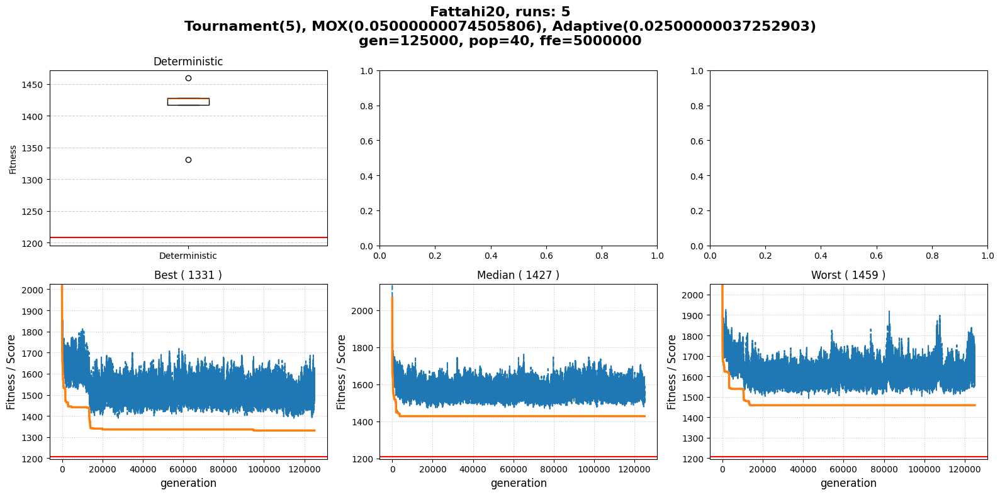

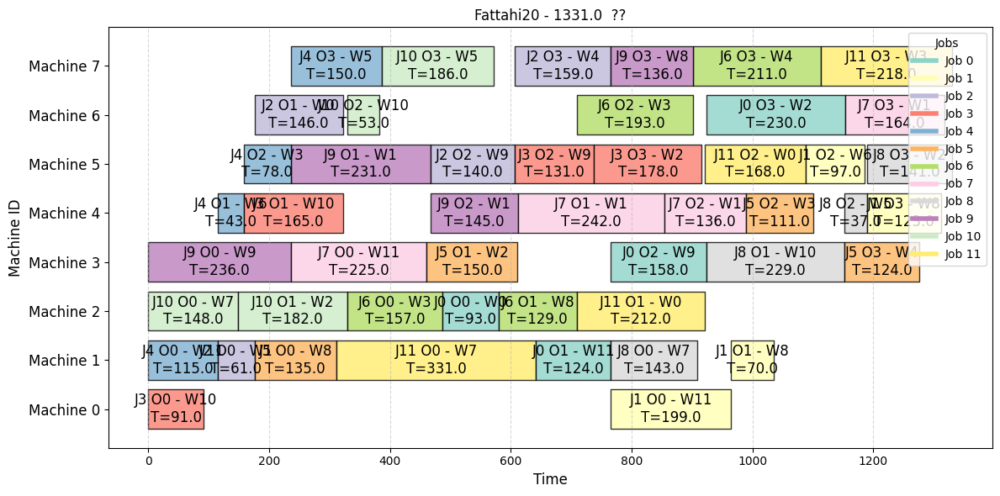

In [12]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.025
remove_clones = True

N = 5

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

experiment(params, N=N)

100%|██████████| 5/5 [05:30<00:00, 66.17s/it]


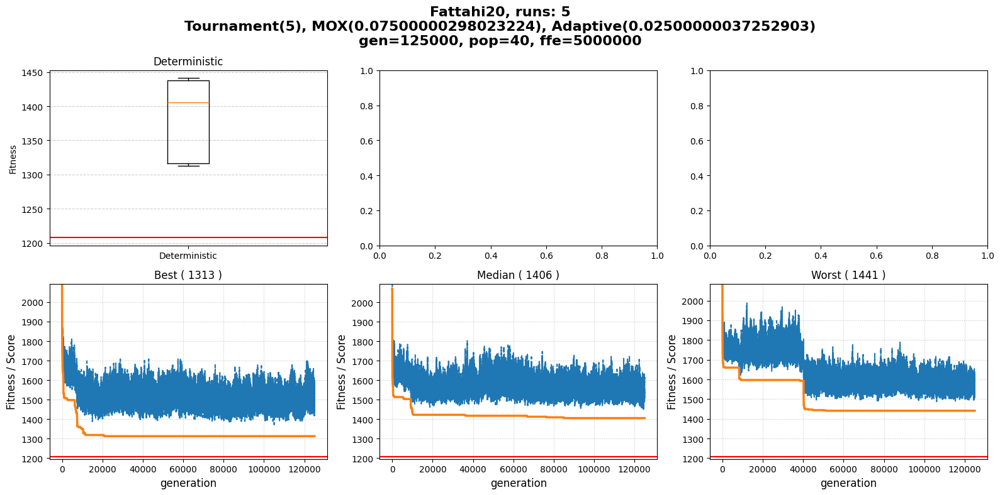

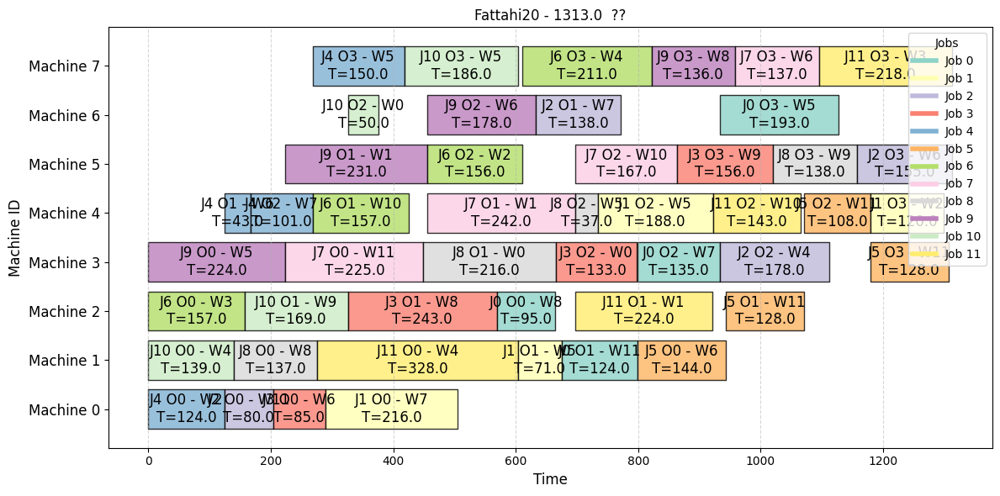

In [13]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.075
mutation_prob = 0.025
remove_clones = True

N = 5

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
)

experiment(params, N=N)

100%|██████████| 5/5 [01:54<00:00, 23.00s/it]


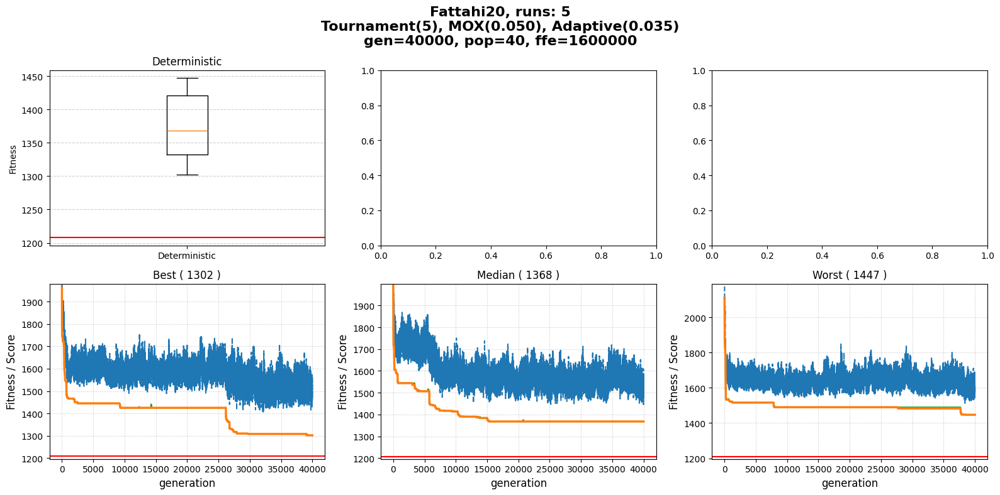

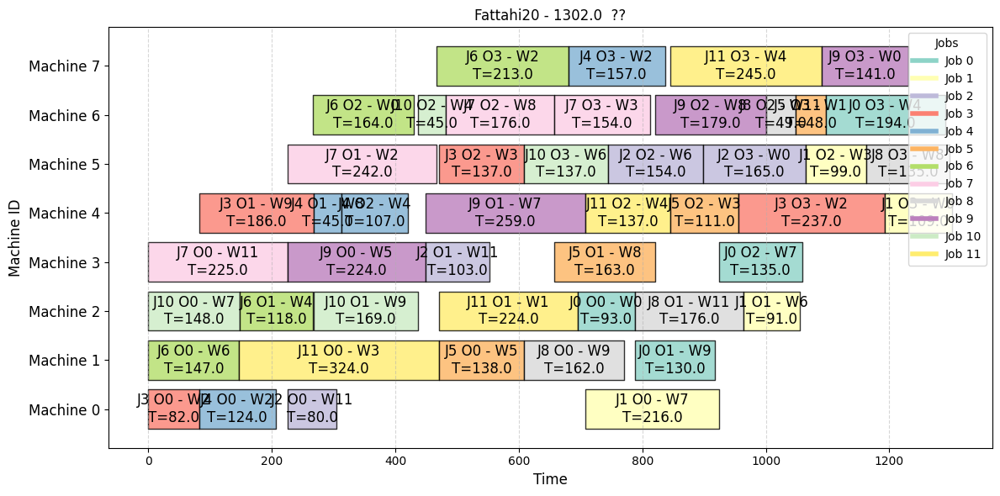

In [5]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 40000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 5

os.makedirs(log_dir, exist_ok=True)

params = GAParams(
    log_dir,
    log_base_name,
    log_output_name,
    generations,
    population_size,
    selection_size,
    crossover_prob,
    mutation_prob,
    remove_clones,
    use_sequence_swap = True,
    use_machines_swap = True,
    use_workers_swap = True,
    use_machines_replacement = True,
    use_workers_replacement = True,
    use_sequence_move = True,
)

experiment(params, N=N)

## Mutation evaluations

### Legend

- Sequence: SWAP (1) vs MOVE (0)
- Machines: SWAP (1) vs REPLACE (0)
- Workers: SWAP (1) vs REPLACE (0)

### Parameters

In [7]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 10

os.makedirs(log_dir, exist_ok=True)

In [ ]:
def mutation_experiment(sequence_val, machines_val, workers_val):
    params = GAParams(
        log_dir,
        log_base_name,
        log_output_name,
        generations,
        population_size,
        selection_size,
        crossover_prob,
        mutation_prob,
        remove_clones,
        sequence_swap_weight = int(sequence_val),
        machines_swap_weight = int(machines_val),
        workers_swap_weight = int(workers_val),
        sequence_move_weight = int(not sequence_val),
        machines_replacement_weight = int(not machines_val),
        workers_replacement_weight = int(not workers_val),
    )

    experiment(params, N=N)

### 000

100%|██████████| 10/10 [04:31<00:00, 27.10s/it]


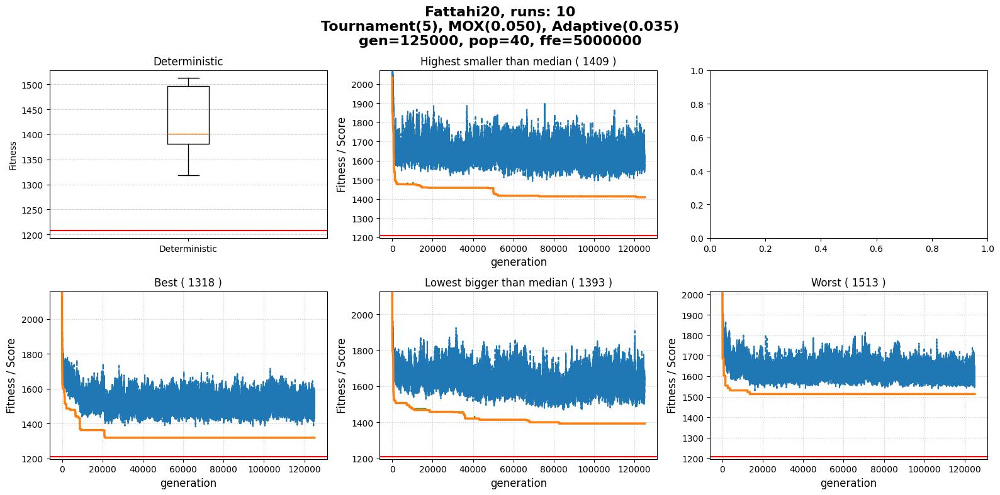

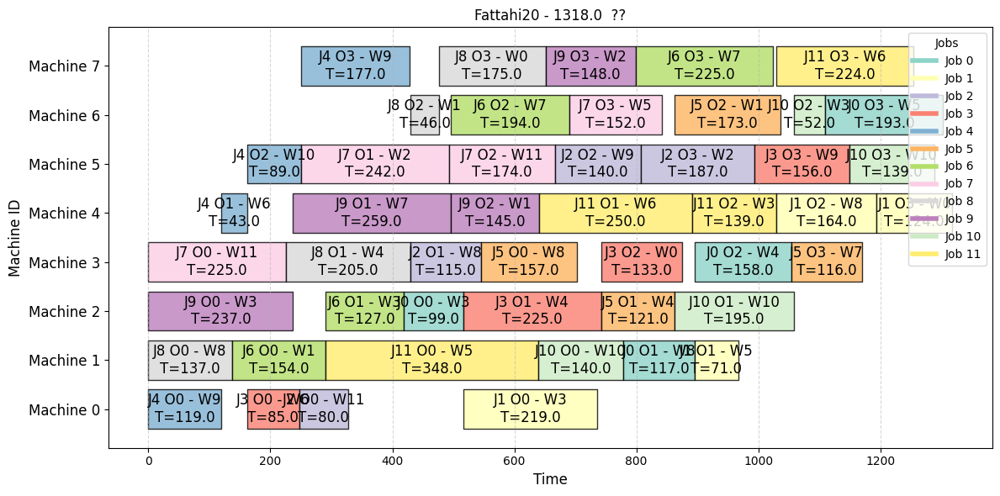

In [ ]:
sequence_val = False
machines_val = False
workers_val = False

mutation_experiment(sequence_val, machines_val, workers_val)

### 001

100%|██████████| 10/10 [05:03<00:00, 30.30s/it]


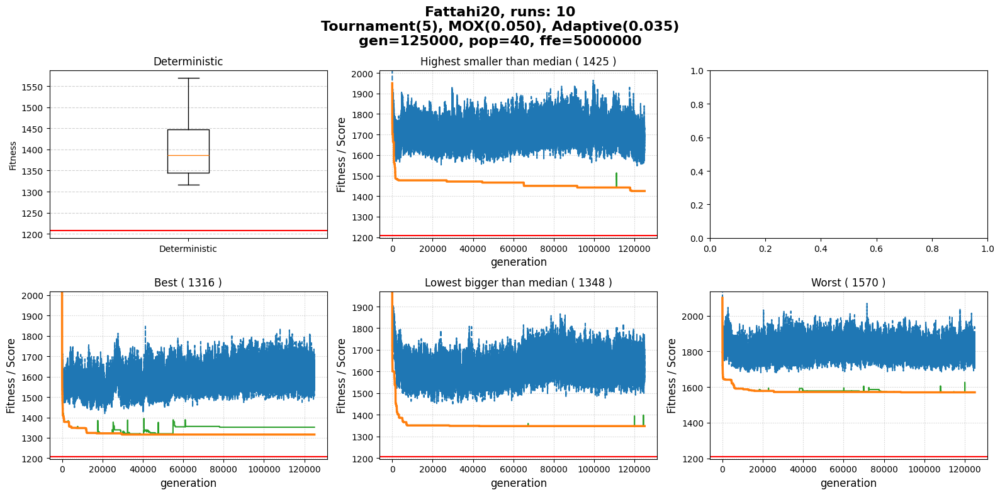

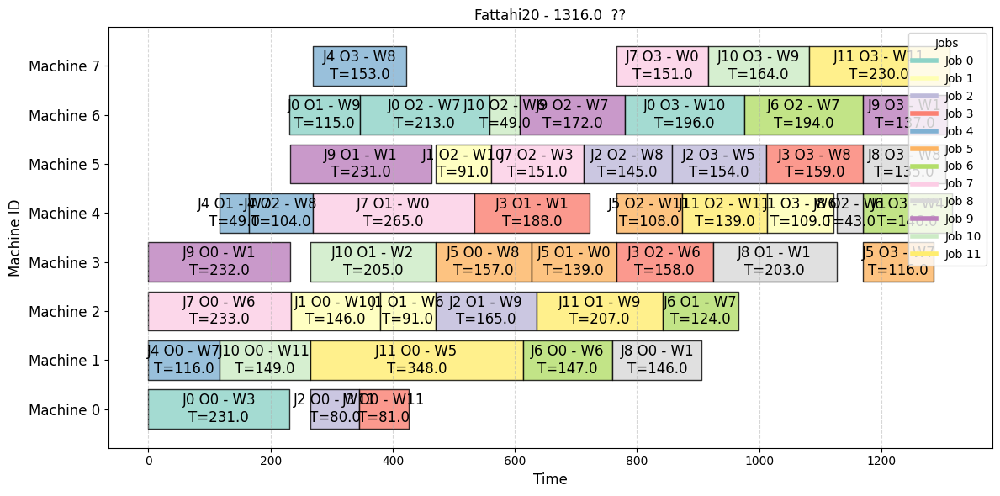

In [ ]:
sequence_val = False
machines_val = False
workers_val = True

mutation_experiment(sequence_val, machines_val, workers_val)

### 010

100%|██████████| 10/10 [04:49<00:00, 28.91s/it]


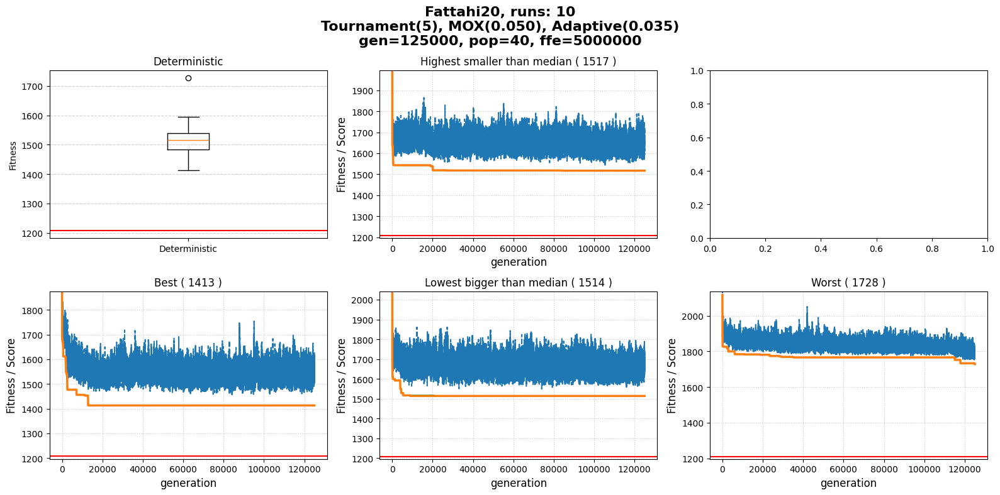

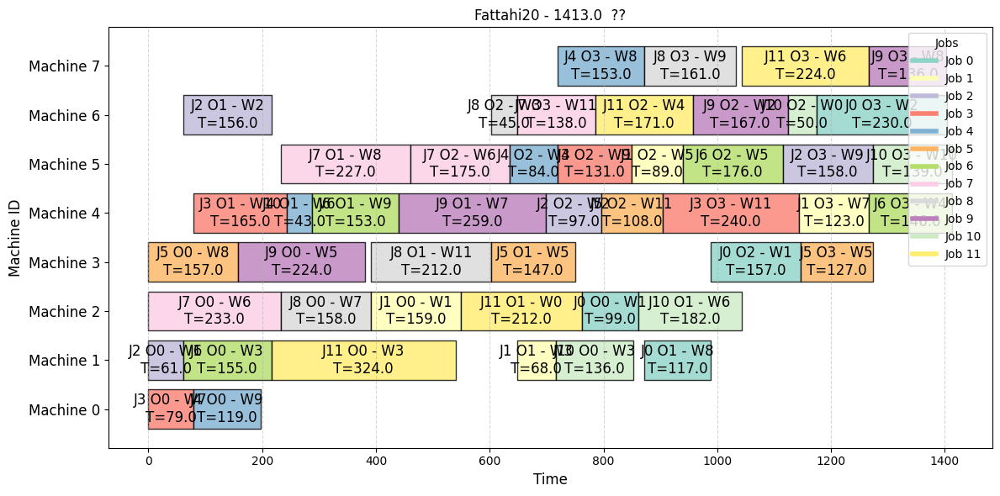

In [ ]:
sequence_val = False
machines_val = True
workers_val = False

mutation_experiment(sequence_val, machines_val, workers_val)

### 011

100%|██████████| 10/10 [05:19<00:00, 31.90s/it]


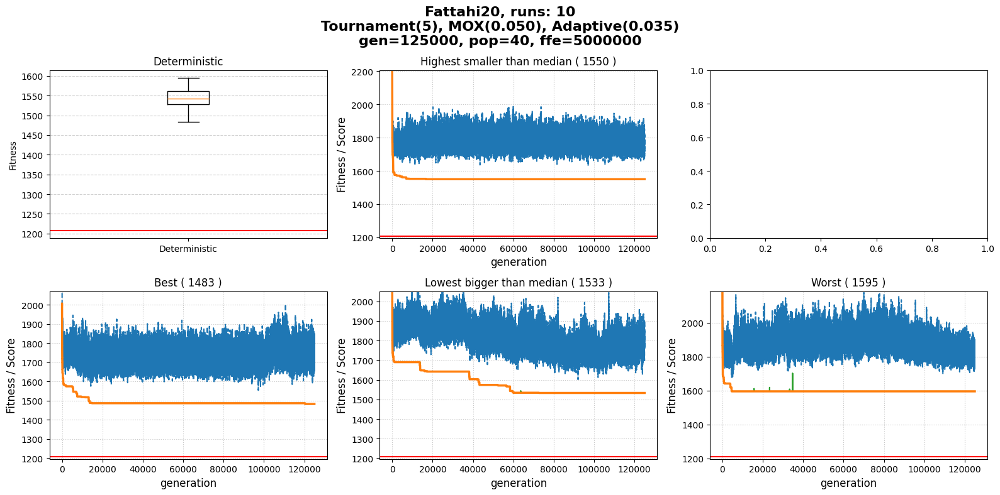

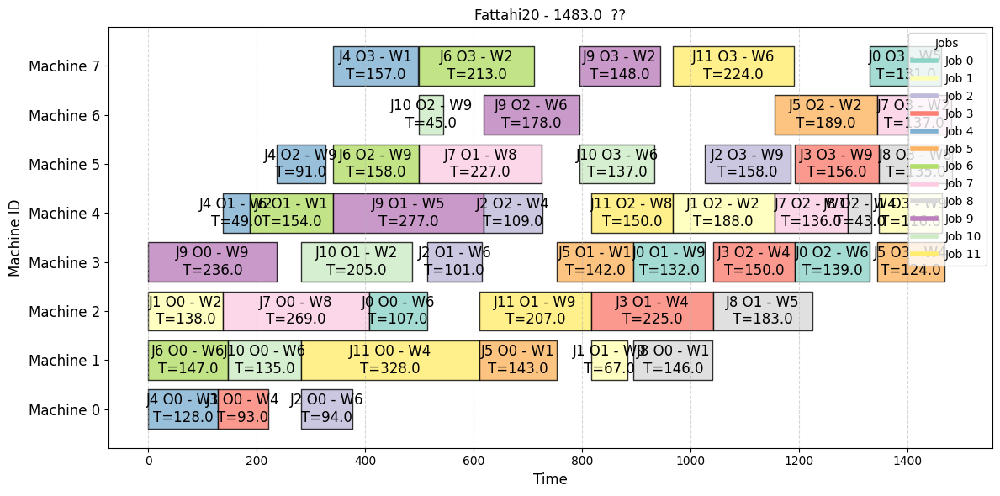

In [ ]:
sequence_val = False
machines_val = True
workers_val = True

mutation_experiment(sequence_val, machines_val, workers_val)

### 100

100%|██████████| 10/10 [04:23<00:00, 26.32s/it]


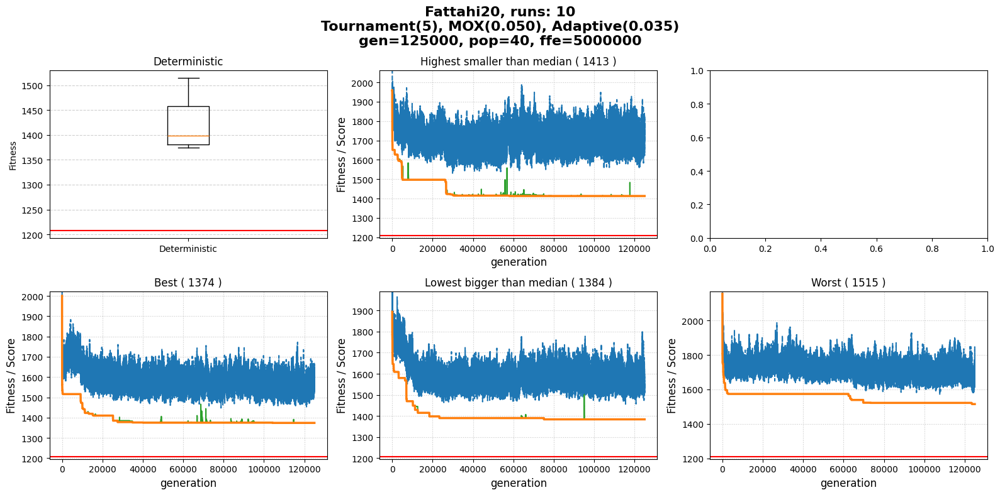

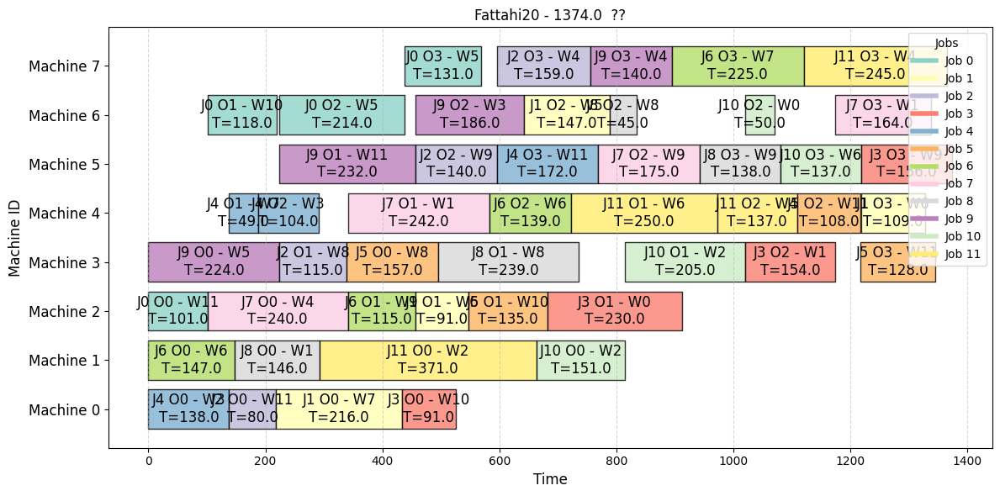

In [ ]:
sequence_val = True
machines_val = False
workers_val = False

mutation_experiment(sequence_val, machines_val, workers_val)

### 101

100%|██████████| 10/10 [04:50<00:00, 29.04s/it]


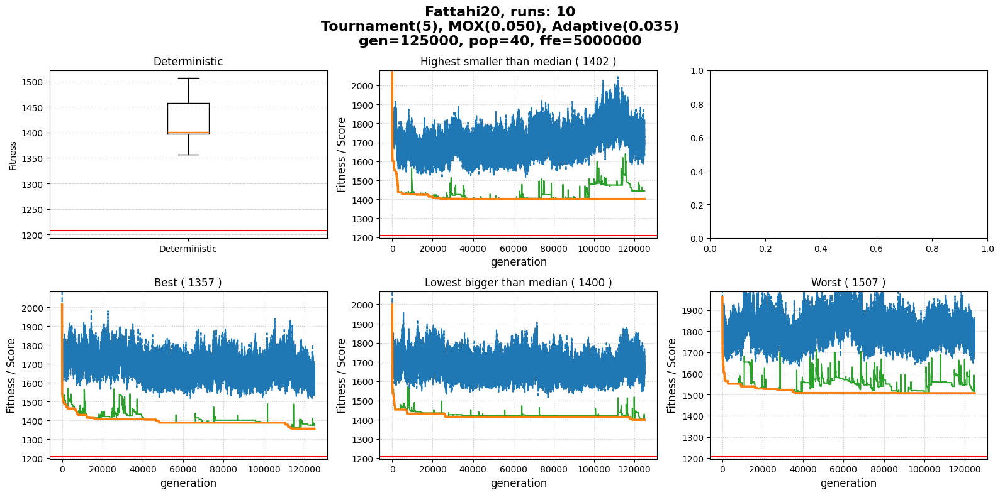

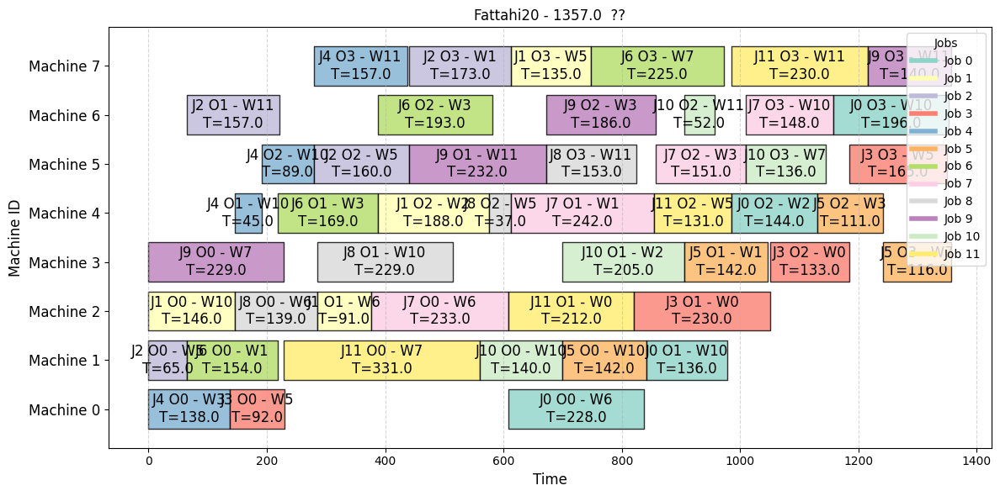

In [ ]:
sequence_val = True
machines_val = False
workers_val = True

mutation_experiment(sequence_val, machines_val, workers_val)

### 110

100%|██████████| 10/10 [04:38<00:00, 27.90s/it]


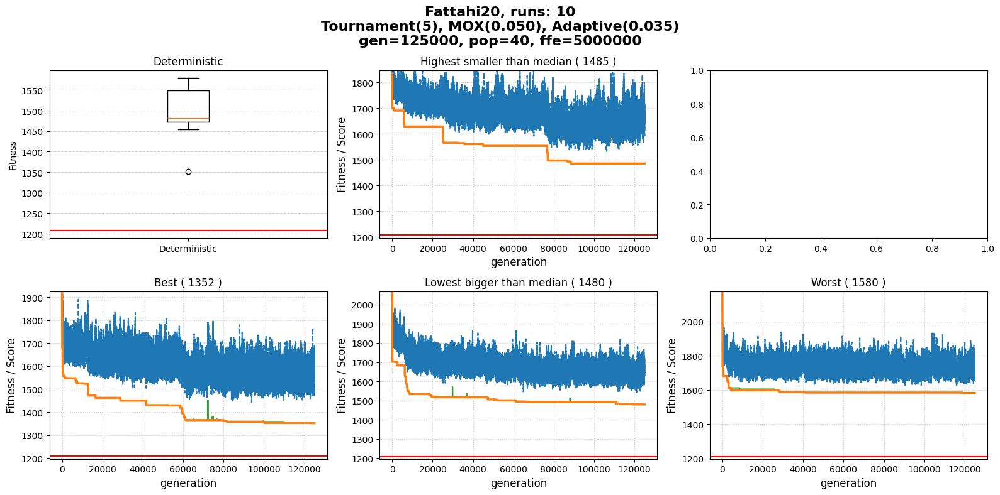

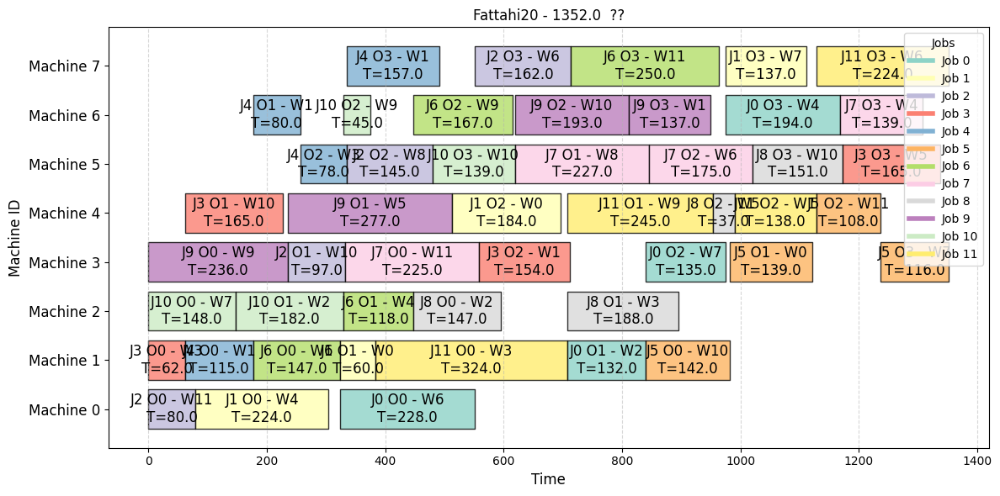

In [ ]:
sequence_val = True
machines_val = True
workers_val = False

mutation_experiment(sequence_val, machines_val, workers_val)

### 111

100%|██████████| 10/10 [05:11<00:00, 31.12s/it]


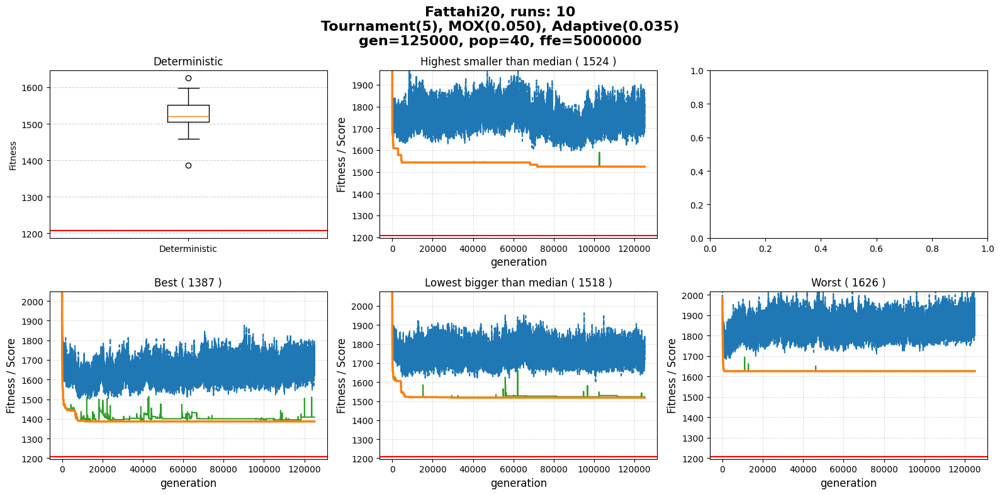

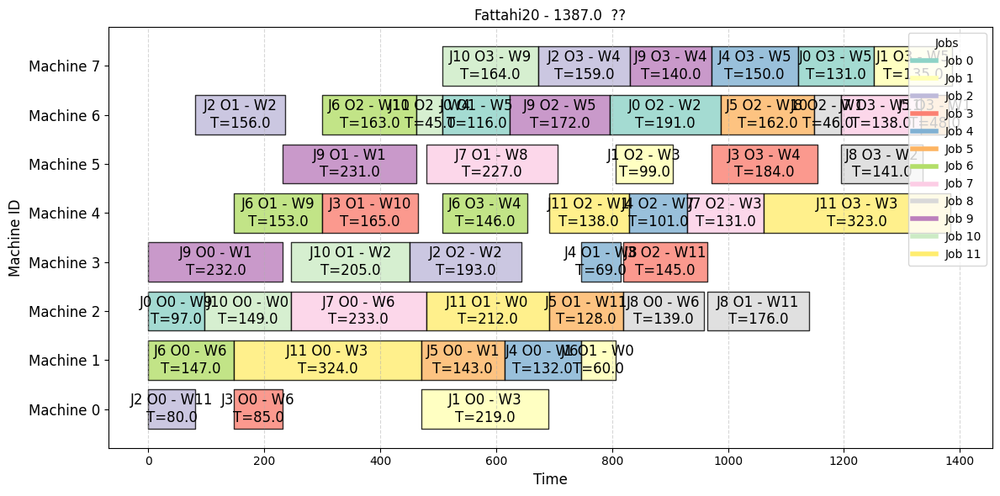

In [ ]:
sequence_val = True
machines_val = True
workers_val = True

mutation_experiment(sequence_val, machines_val, workers_val)

## Mutation weights experiments

### Config

In [11]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 10

os.makedirs(log_dir, exist_ok=True)

In [12]:
def mutation_weights_experiment(
    sequence_swap_weight,
    machines_swap_weight,
    workers_swap_weight,
    sequence_move_weight,
    machines_replacement_weight,
    workers_replacement_weight,
    **kwargs,
):
    _log_dir = kwargs.get("log_dir", log_dir)
    _log_base_name = kwargs.get("log_base_name", log_base_name)
    _log_output_name = kwargs.get("log_output_name", log_output_name)
    _generations = kwargs.get("generations", generations)
    _population_size = kwargs.get("population_size", population_size)
    _selection_size = kwargs.get("selection_size", selection_size)
    _crossover_prob = kwargs.get("crossover_prob", crossover_prob)
    _mutation_prob = kwargs.get("mutation_prob", mutation_prob)
    _remove_clones = kwargs.get("remove_clones", remove_clones)
    params = GAParams(
        _log_dir,
        _log_base_name,
        _log_output_name,
        _generations,
        _population_size,
        _selection_size,
        _crossover_prob,
        _mutation_prob,
        _remove_clones,
        sequence_swap_weight = sequence_swap_weight,
        machines_swap_weight = machines_swap_weight,
        workers_swap_weight = workers_swap_weight,
        sequence_move_weight = sequence_move_weight,
        machines_replacement_weight = machines_replacement_weight,
        workers_replacement_weight = workers_replacement_weight,
    )

    experiment(params, N=N)

### Low machine replace

100%|██████████| 10/10 [05:09<00:00, 30.98s/it]


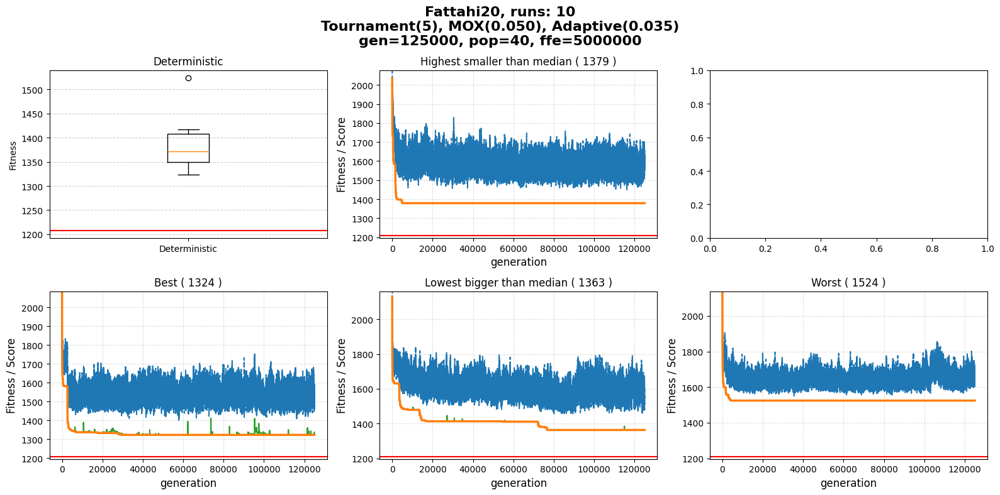

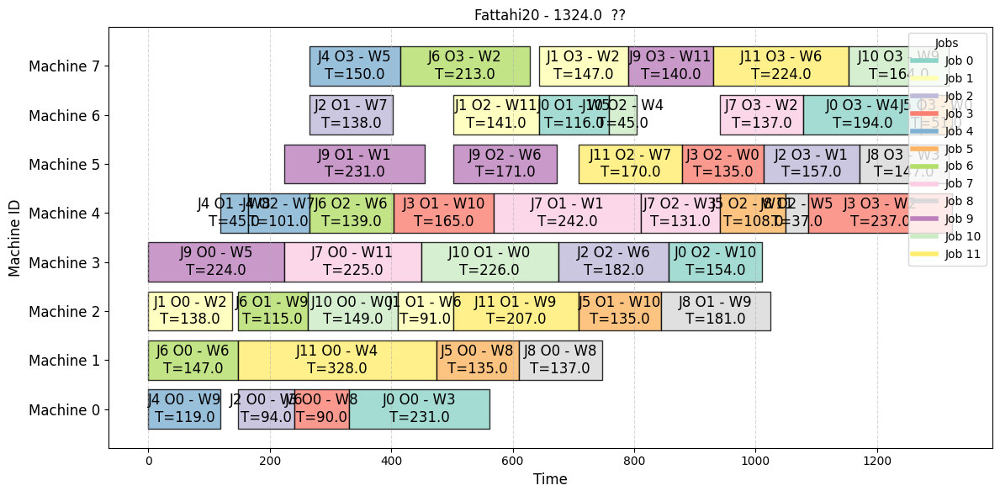

In [7]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT,
    "machines_swap_weight": BASE_WEIGHT,
    "workers_swap_weight": BASE_WEIGHT,
    "sequence_move_weight": BASE_WEIGHT,
    "machines_replacement_weight": BASE_WEIGHT // 2,
    "workers_replacement_weight": BASE_WEIGHT,
}

mutation_weights_experiment(**weights)

### Low machine replace + high worker mutations

100%|██████████| 10/10 [04:59<00:00, 29.92s/it]


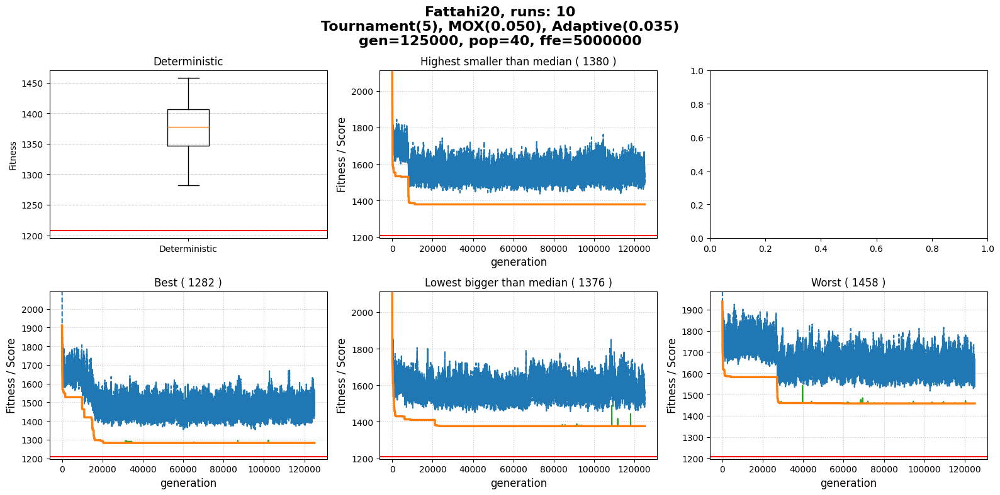

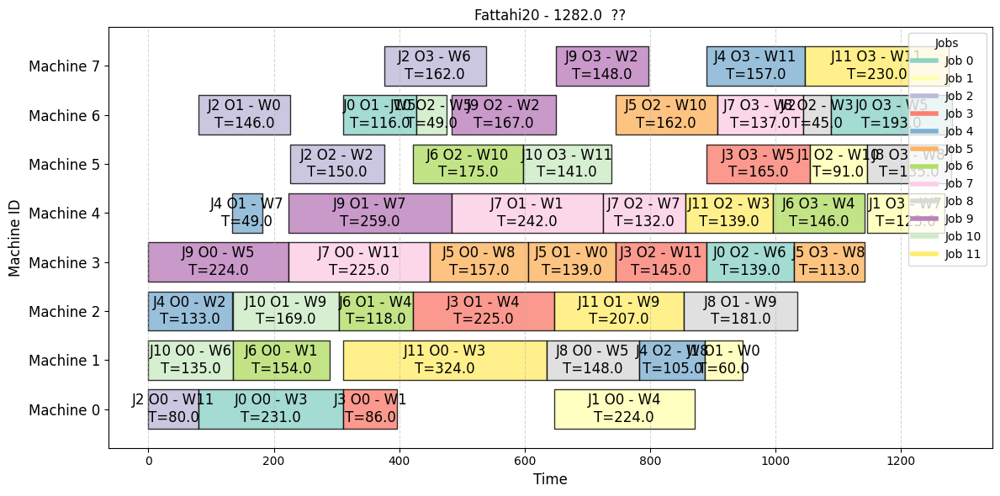

In [8]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT,
    "machines_swap_weight": BASE_WEIGHT,
    "workers_swap_weight": BASE_WEIGHT + 1,
    "sequence_move_weight": BASE_WEIGHT,
    "machines_replacement_weight": BASE_WEIGHT // 2,
    "workers_replacement_weight": BASE_WEIGHT + 1,
}

mutation_weights_experiment(**weights)

### Low machine replace + high worker mutations + slightly lower sequence swap

100%|██████████| 10/10 [04:57<00:00, 29.78s/it]


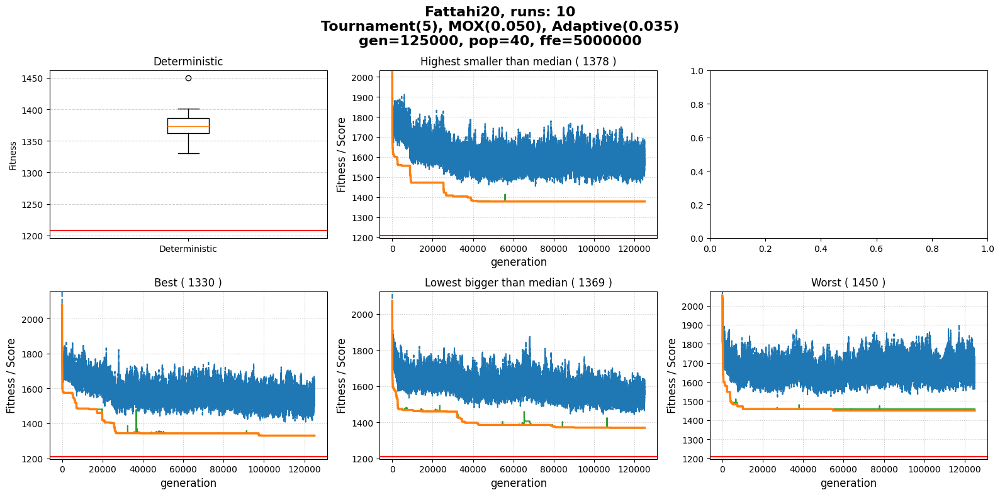

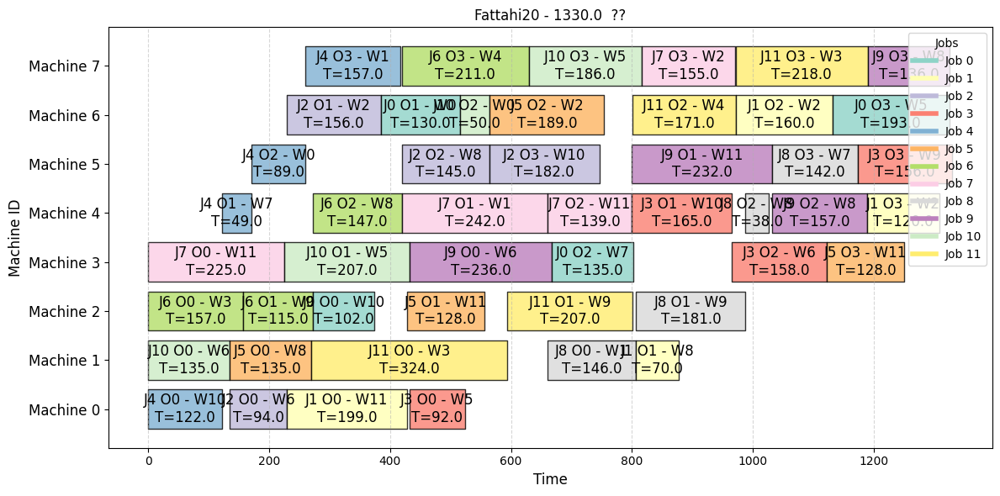

In [9]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT - 2,
    "machines_swap_weight": BASE_WEIGHT,
    "workers_swap_weight": BASE_WEIGHT + 1,
    "sequence_move_weight": BASE_WEIGHT,
    "machines_replacement_weight": BASE_WEIGHT // 2,
    "workers_replacement_weight": BASE_WEIGHT + 1,
}

mutation_weights_experiment(**weights)

### Low machine replace + high worker mutations + slightly lower sequence swap + higher mutation

100%|██████████| 10/10 [05:36<00:00, 33.64s/it]


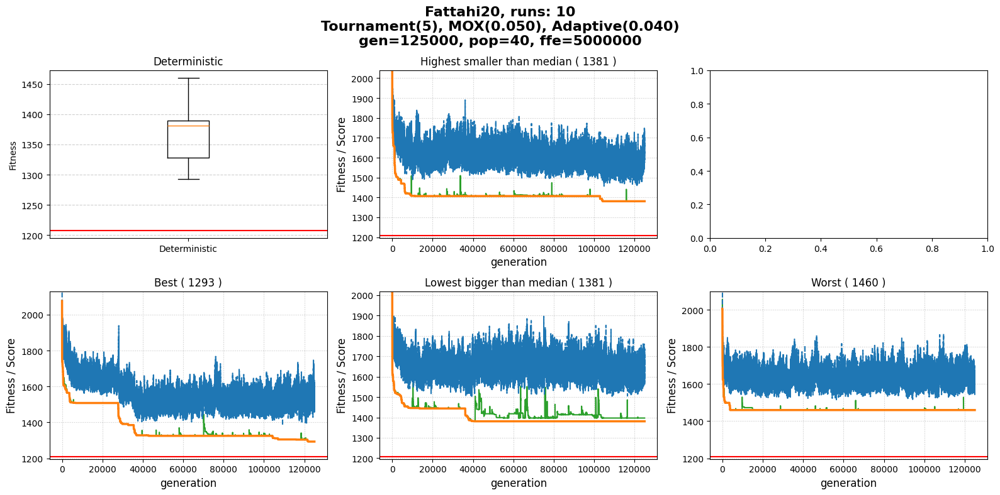

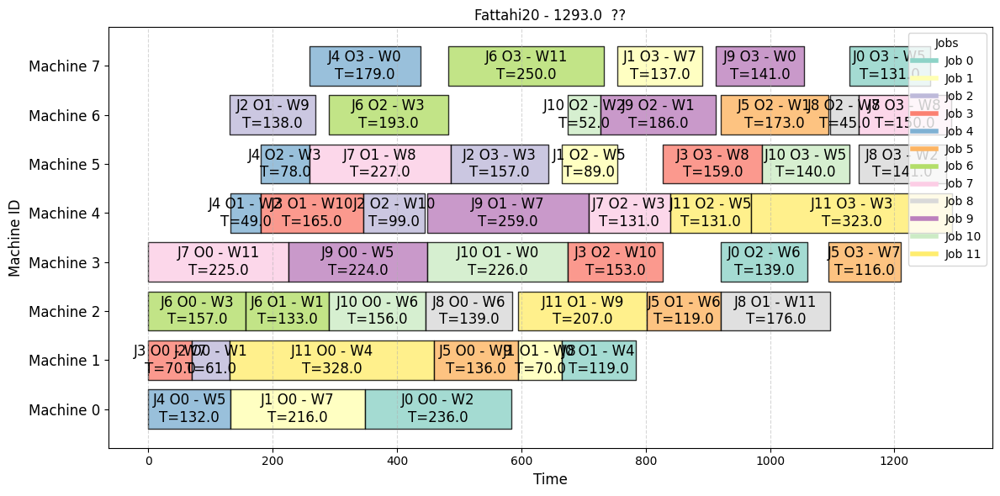

In [7]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT - 2,
    "machines_swap_weight": BASE_WEIGHT,
    "workers_swap_weight": BASE_WEIGHT + 1,
    "sequence_move_weight": BASE_WEIGHT,
    "machines_replacement_weight": BASE_WEIGHT // 2,
    "workers_replacement_weight": BASE_WEIGHT + 1,
}

mutation_weights_experiment(**weights, mutation_prob=0.04)

### Low machine replace + high worker mutations + slightly lower sequence swap + lower mutation

100%|██████████| 10/10 [05:05<00:00, 30.51s/it]


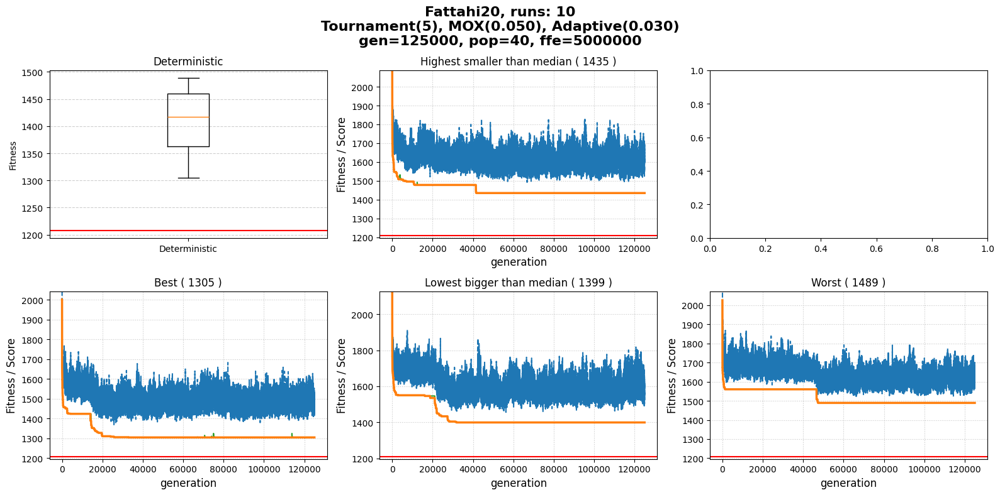

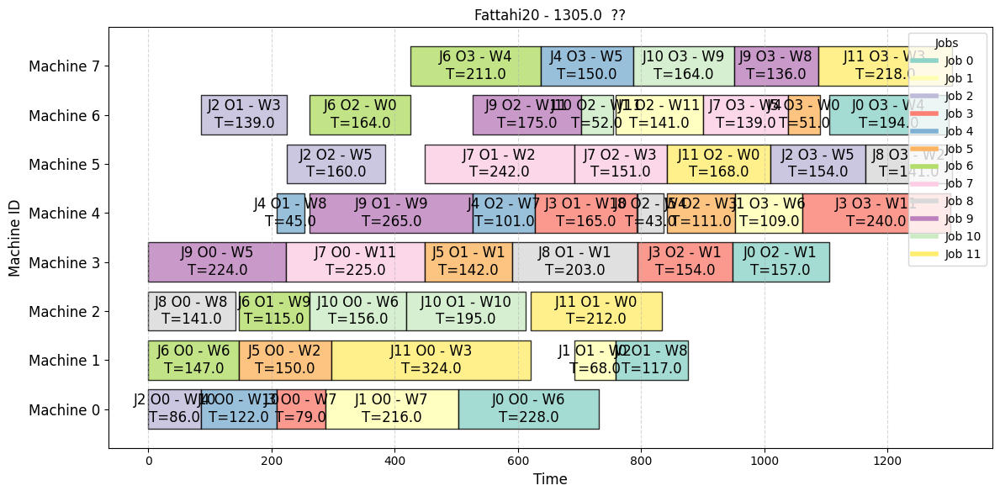

In [8]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT - 2,
    "machines_swap_weight": BASE_WEIGHT,
    "workers_swap_weight": BASE_WEIGHT + 1,
    "sequence_move_weight": BASE_WEIGHT,
    "machines_replacement_weight": BASE_WEIGHT // 2,
    "workers_replacement_weight": BASE_WEIGHT + 1,
}

mutation_weights_experiment(**weights, mutation_prob=0.03)

### Low machine replace + high worker and sequence mutations

100%|██████████| 10/10 [05:00<00:00, 30.09s/it]


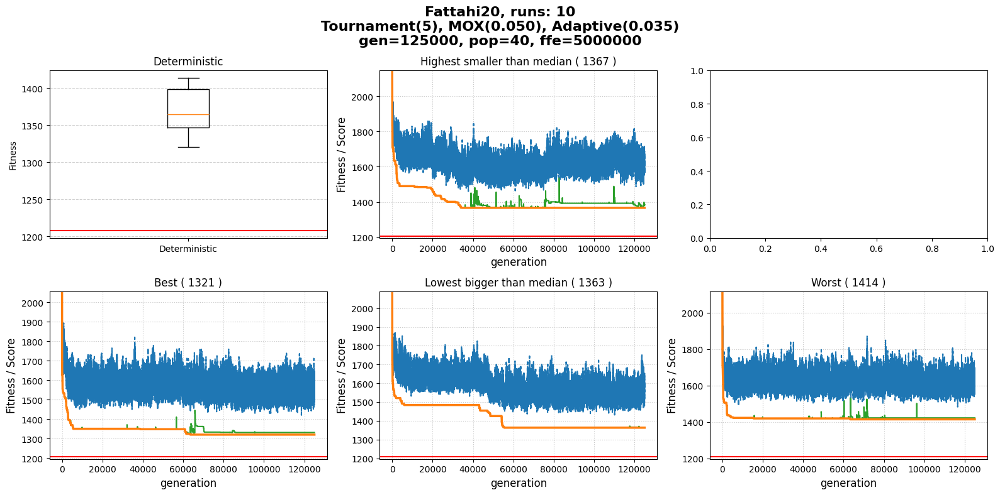

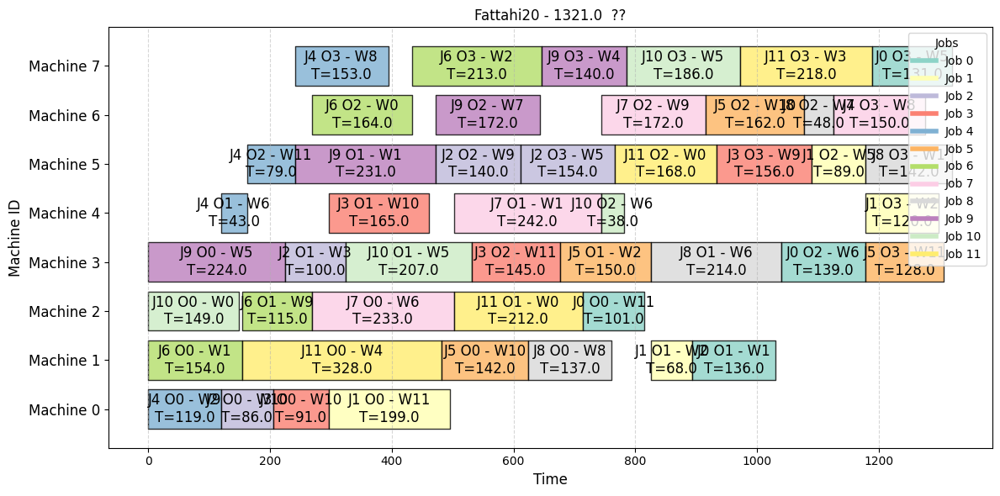

In [ ]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +2,
    "machines_swap_weight": BASE_WEIGHT +0,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +2,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights)

### Worker heavy mutation - worker=50%, sequence=35%, machine=15%

Sum of weights: 60. Weights: {'sequence_swap_weight': 10, 'machines_swap_weight': 5, 'workers_swap_weight': 15, 'sequence_move_weight': 10, 'machines_replacement_weight': 5, 'workers_replacement_weight': 15}


100%|██████████| 10/10 [05:04<00:00, 30.42s/it]


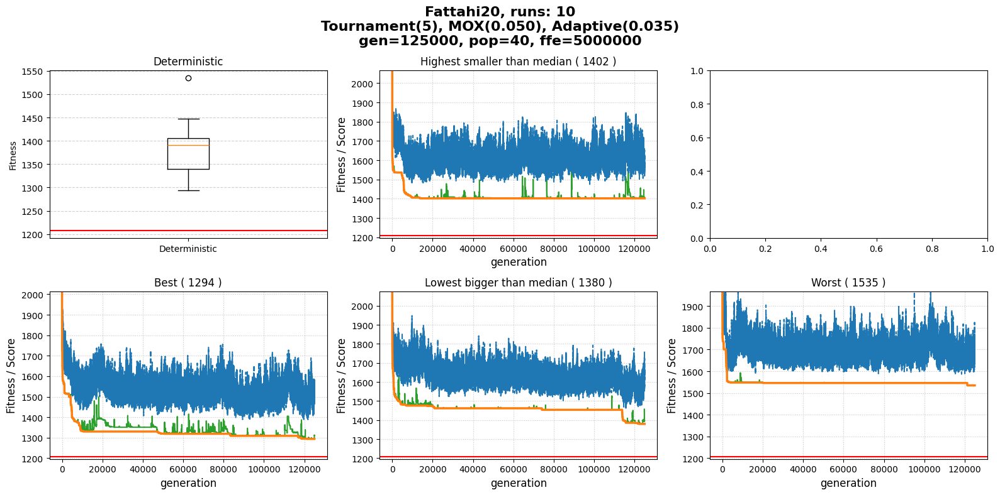

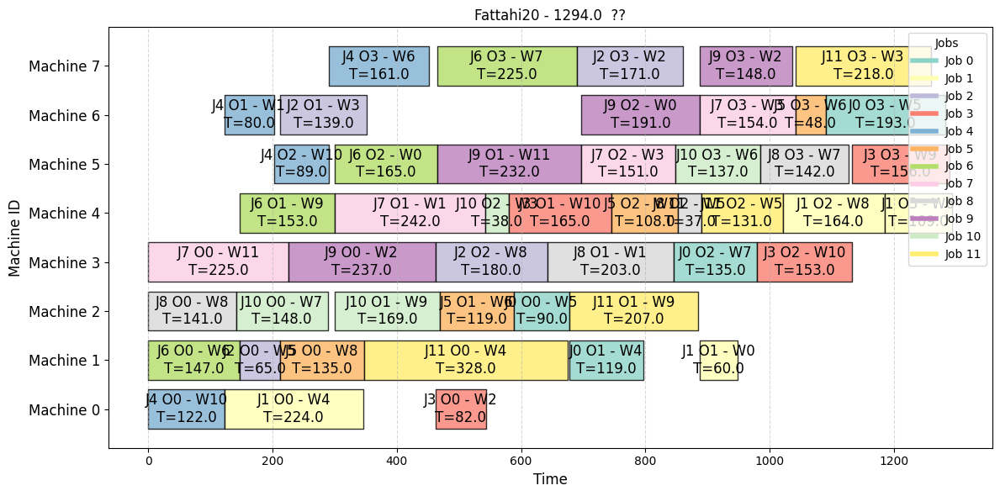

In [10]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +0,
    "machines_swap_weight": BASE_WEIGHT -5,
    "workers_swap_weight": BASE_WEIGHT +5,
    "sequence_move_weight": BASE_WEIGHT +0,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +5,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights)

### Worker heavy mutation, mut_prob=2% - worker=50%, sequence=35%, machine=15%

Sum of weights: 60. Weights: {'sequence_swap_weight': 10, 'machines_swap_weight': 5, 'workers_swap_weight': 15, 'sequence_move_weight': 10, 'machines_replacement_weight': 5, 'workers_replacement_weight': 15}


100%|██████████| 10/10 [04:43<00:00, 28.34s/it]


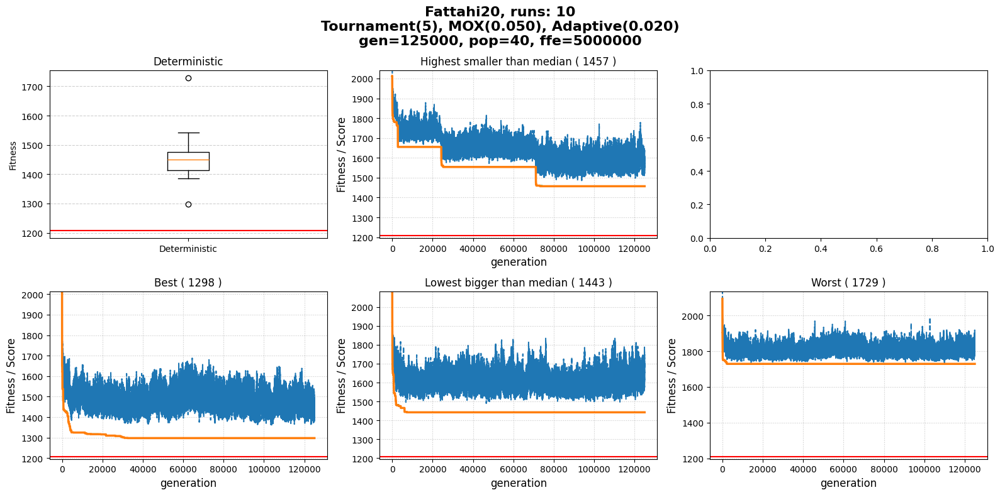

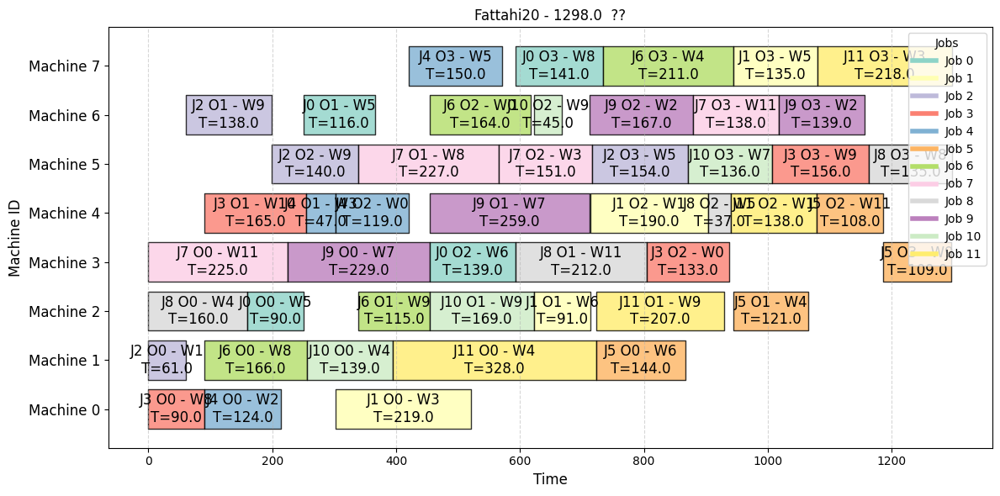

In [11]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +0,
    "machines_swap_weight": BASE_WEIGHT -5,
    "workers_swap_weight": BASE_WEIGHT +5,
    "sequence_move_weight": BASE_WEIGHT +0,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +5,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, mutation_prob=0.02)

### Worker heavy mutation, mut_prob=3% - worker=43%, sequence=43%, machine=14%

Sum of weights: 70. Weights: {'sequence_swap_weight': 15, 'machines_swap_weight': 5, 'workers_swap_weight': 15, 'sequence_move_weight': 15, 'machines_replacement_weight': 5, 'workers_replacement_weight': 15}


100%|██████████| 10/10 [04:48<00:00, 28.87s/it]


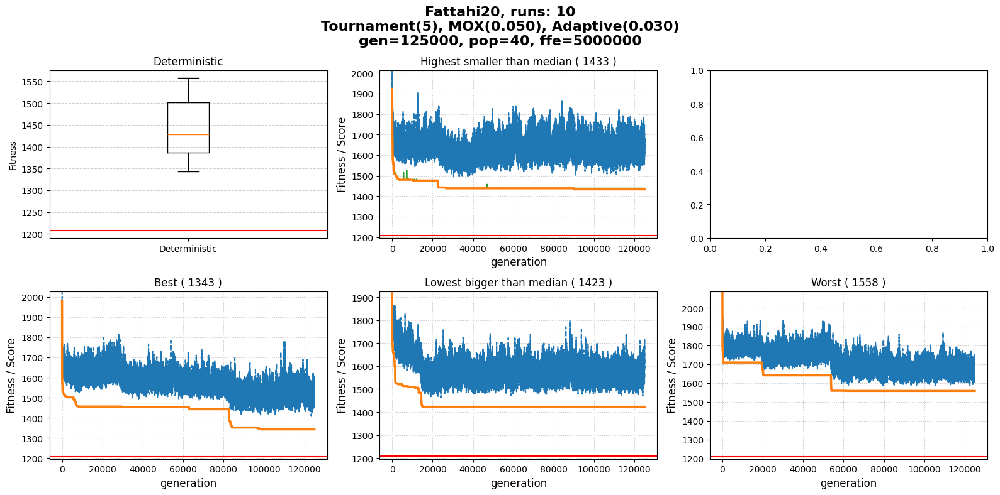

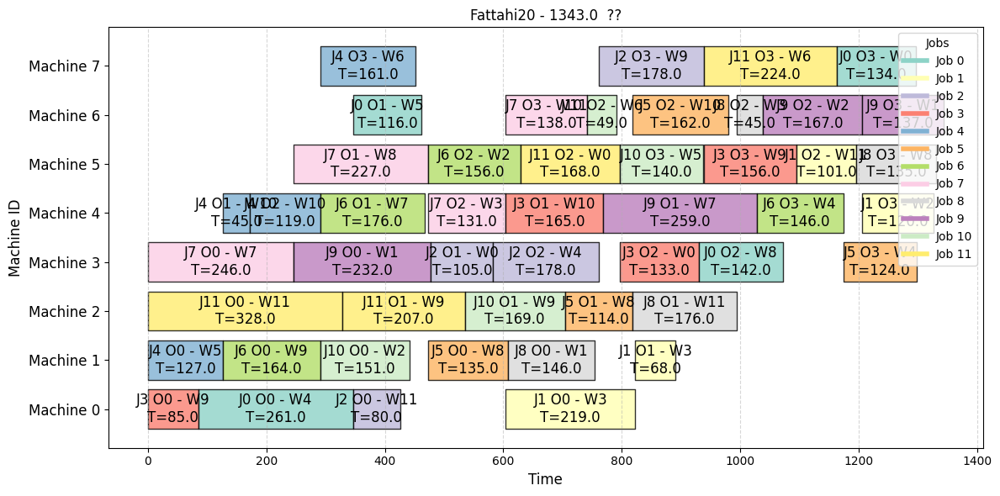

In [12]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +5,
    "machines_swap_weight": BASE_WEIGHT -5,
    "workers_swap_weight": BASE_WEIGHT +5,
    "sequence_move_weight": BASE_WEIGHT +5,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +5,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, mutation_prob=0.03)

### Worker heavy mutation, mut_prob=4% - worker=43%, sequence=43%, machine=14%

Sum of weights: 70. Weights: {'sequence_swap_weight': 15, 'machines_swap_weight': 5, 'workers_swap_weight': 15, 'sequence_move_weight': 15, 'machines_replacement_weight': 5, 'workers_replacement_weight': 15}


100%|██████████| 10/10 [05:10<00:00, 31.02s/it]


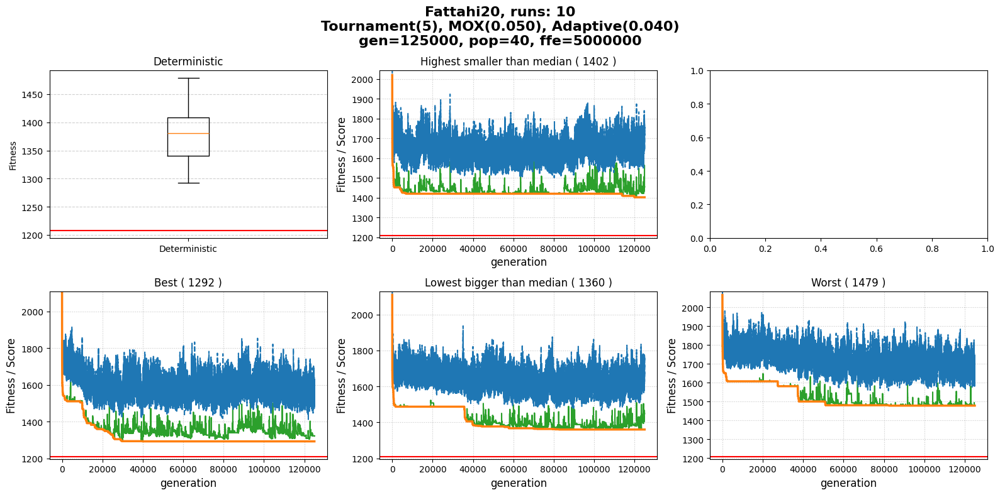

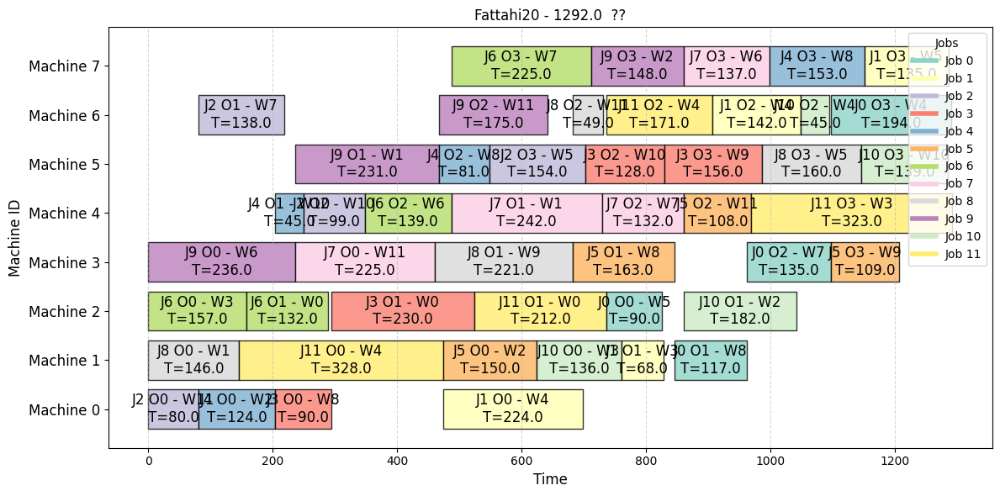

In [13]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +5,
    "machines_swap_weight": BASE_WEIGHT -5,
    "workers_swap_weight": BASE_WEIGHT +5,
    "sequence_move_weight": BASE_WEIGHT +5,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +5,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, mutation_prob=0.04)

### Worker heavy mutation, mut_prob=3.5% - worker=38%, sequence=38%, machine=23%

Sum of weights: 130. Weights: {'sequence_swap_weight': 25, 'machines_swap_weight': 15, 'workers_swap_weight': 25, 'sequence_move_weight': 25, 'machines_replacement_weight': 15, 'workers_replacement_weight': 25}


100%|██████████| 10/10 [05:03<00:00, 30.38s/it]


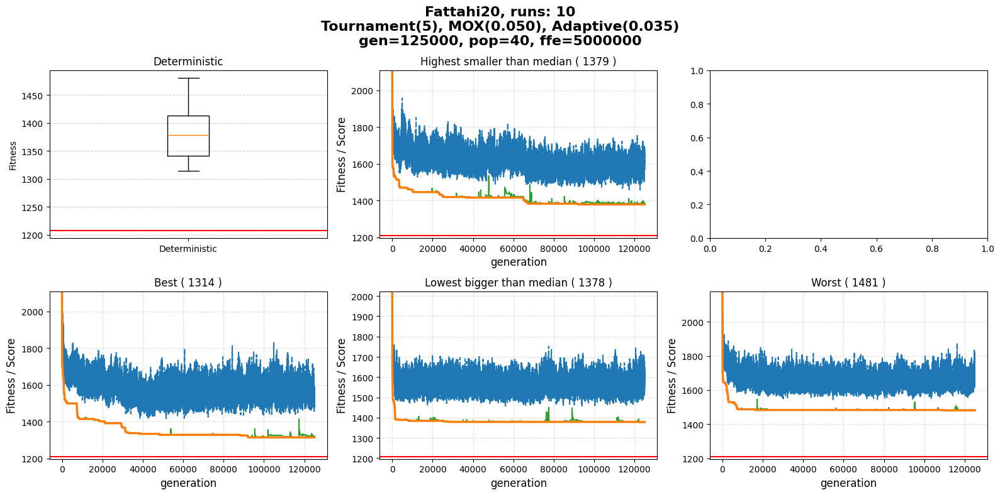

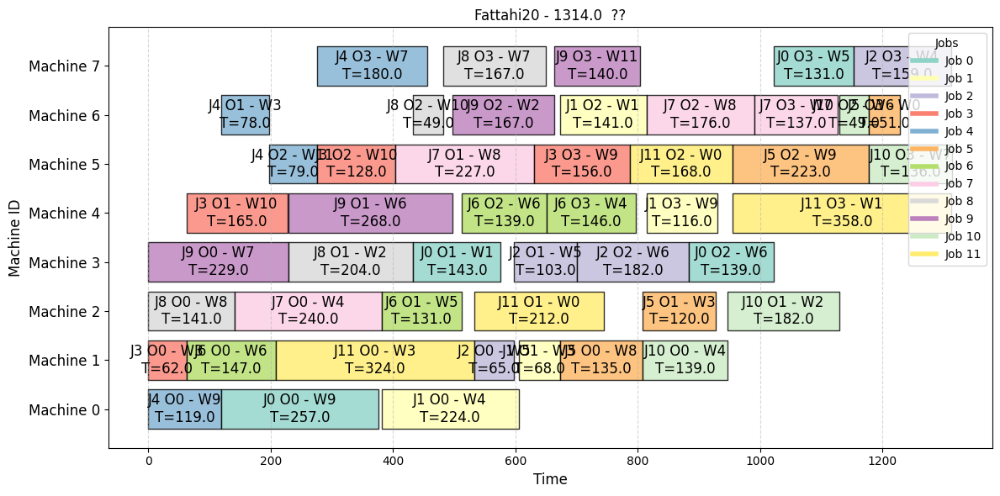

In [7]:
BASE_WEIGHT = 20
weights = {
    "sequence_swap_weight": BASE_WEIGHT +5,
    "machines_swap_weight": BASE_WEIGHT -5,
    "workers_swap_weight": BASE_WEIGHT +5,
    "sequence_move_weight": BASE_WEIGHT +5,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +5,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, mutation_prob=0.035)

## Winning config further experiments

### Config

In [5]:
log_dir = "logs"
log_base_name = "genetic_from_python"
log_output_name = "best_indv"
generations = 125000
population_size = 40
selection_size = 5
crossover_prob = 0.05
mutation_prob = 0.035
remove_clones = True

N = 10

os.makedirs(log_dir, exist_ok=True)
def mutation_weights_experiment(
    sequence_swap_weight,
    machines_swap_weight,
    workers_swap_weight,
    sequence_move_weight,
    machines_replacement_weight,
    workers_replacement_weight,
    **kwargs,
):
    _log_dir = kwargs.get("log_dir", log_dir)
    _log_base_name = kwargs.get("log_base_name", log_base_name)
    _log_output_name = kwargs.get("log_output_name", log_output_name)
    _generations = kwargs.get("generations", generations)
    _population_size = kwargs.get("population_size", population_size)
    _selection_size = kwargs.get("selection_size", selection_size)
    _crossover_prob = kwargs.get("crossover_prob", crossover_prob)
    _mutation_prob = kwargs.get("mutation_prob", mutation_prob)
    _remove_clones = kwargs.get("remove_clones", remove_clones)
    _N = kwargs.get("N", N)
    params = GAParams(
        _log_dir,
        _log_base_name,
        _log_output_name,
        _generations,
        _population_size,
        _selection_size,
        _crossover_prob,
        _mutation_prob,
        _remove_clones,
        sequence_swap_weight = sequence_swap_weight,
        machines_swap_weight = machines_swap_weight,
        workers_swap_weight = workers_swap_weight,
        sequence_move_weight = sequence_move_weight,
        machines_replacement_weight = machines_replacement_weight,
        workers_replacement_weight = workers_replacement_weight,
    )

    experiment(params, N=_N)

### Winning config

Sum of weights: 61. Weights: {'sequence_swap_weight': 12, 'machines_swap_weight': 10, 'workers_swap_weight': 11, 'sequence_move_weight': 12, 'machines_replacement_weight': 5, 'workers_replacement_weight': 11}


100%|██████████| 5/5 [05:31<00:00, 66.34s/it]


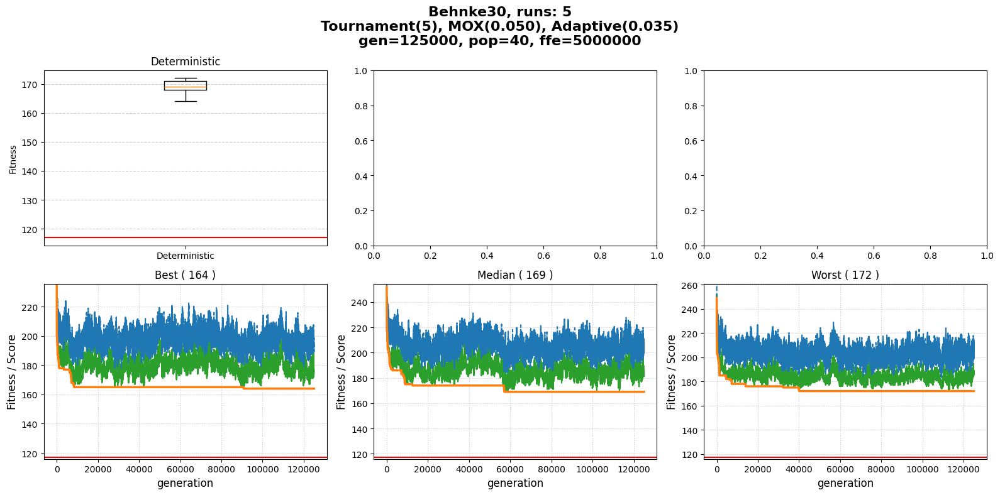

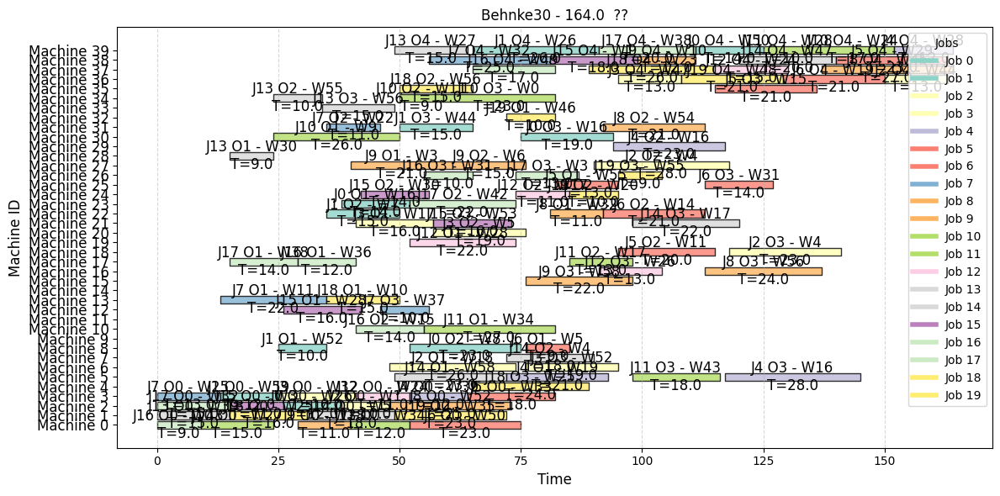

In [7]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +2,
    "machines_swap_weight": BASE_WEIGHT +0,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +2,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, crossover_prob=0.05, N=5)

### Lower TOUR: 4

Sum of weights: 61. Weights: {'sequence_swap_weight': 12, 'machines_swap_weight': 10, 'workers_swap_weight': 11, 'sequence_move_weight': 12, 'machines_replacement_weight': 5, 'workers_replacement_weight': 11}


100%|██████████| 10/10 [05:23<00:00, 32.32s/it]


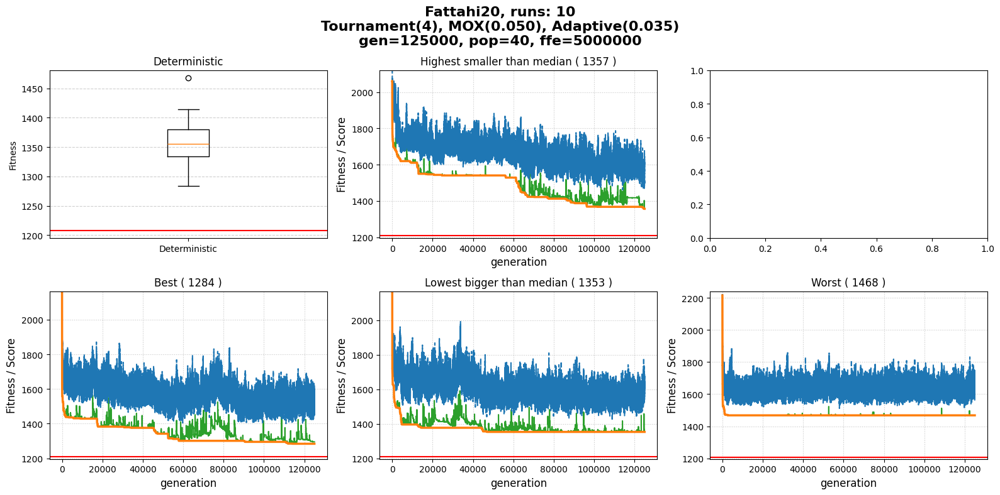

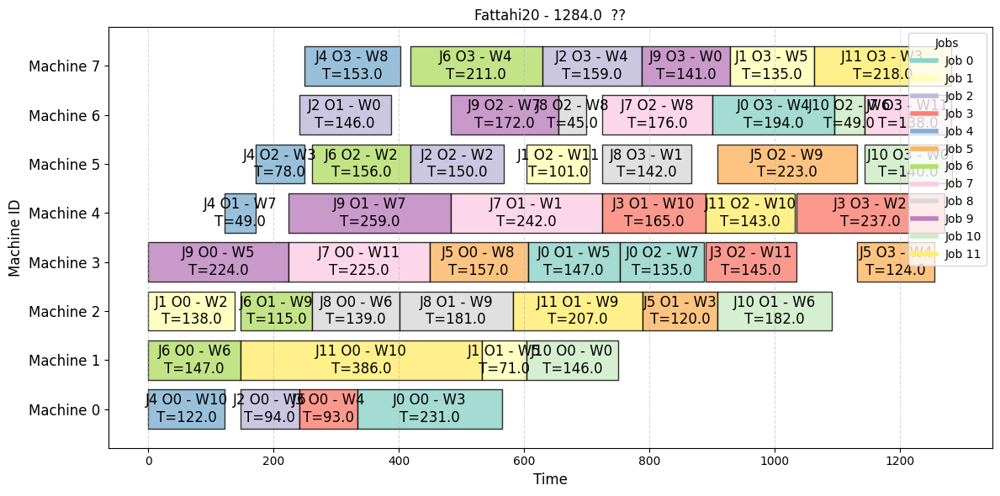

In [14]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +2,
    "machines_swap_weight": BASE_WEIGHT +0,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +2,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, selection_size=4)

### Increased sequence mutation weights

Sum of weights: 61. Weights: {'sequence_swap_weight': 13, 'machines_swap_weight': 8, 'workers_swap_weight': 11, 'sequence_move_weight': 13, 'machines_replacement_weight': 5, 'workers_replacement_weight': 11}


100%|██████████| 10/10 [05:25<00:00, 32.59s/it]


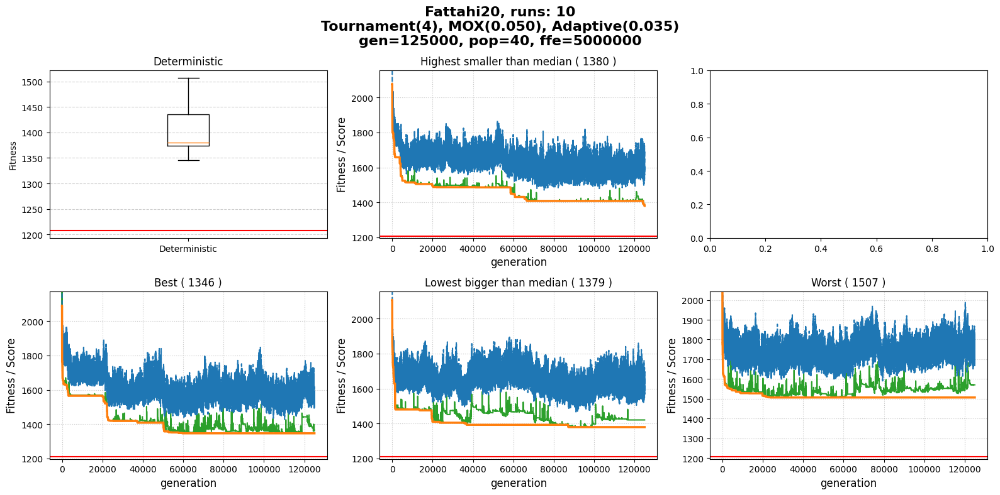

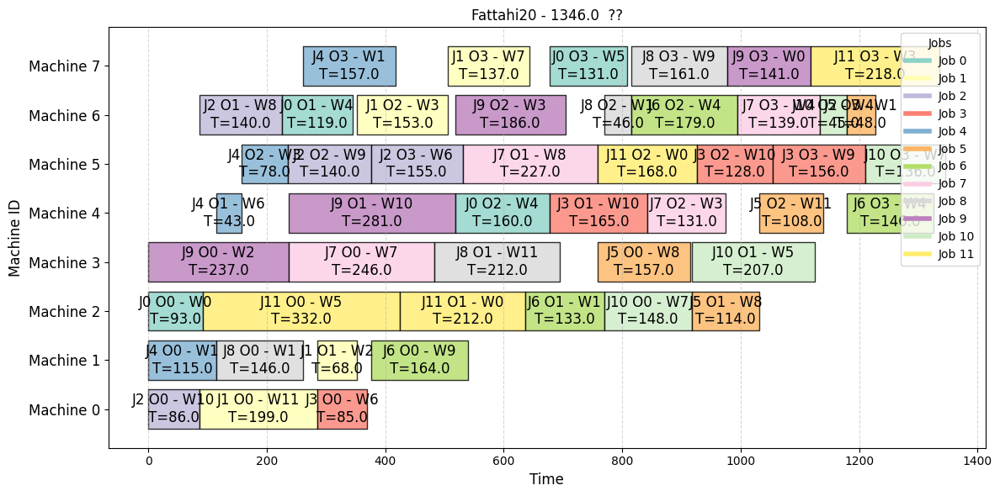

In [15]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +3,
    "machines_swap_weight": BASE_WEIGHT -2,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +3,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, selection_size=4)

### Even lower TOUR: 3

Sum of weights: 61. Weights: {'sequence_swap_weight': 13, 'machines_swap_weight': 8, 'workers_swap_weight': 11, 'sequence_move_weight': 13, 'machines_replacement_weight': 5, 'workers_replacement_weight': 11}


100%|██████████| 10/10 [04:58<00:00, 29.89s/it]


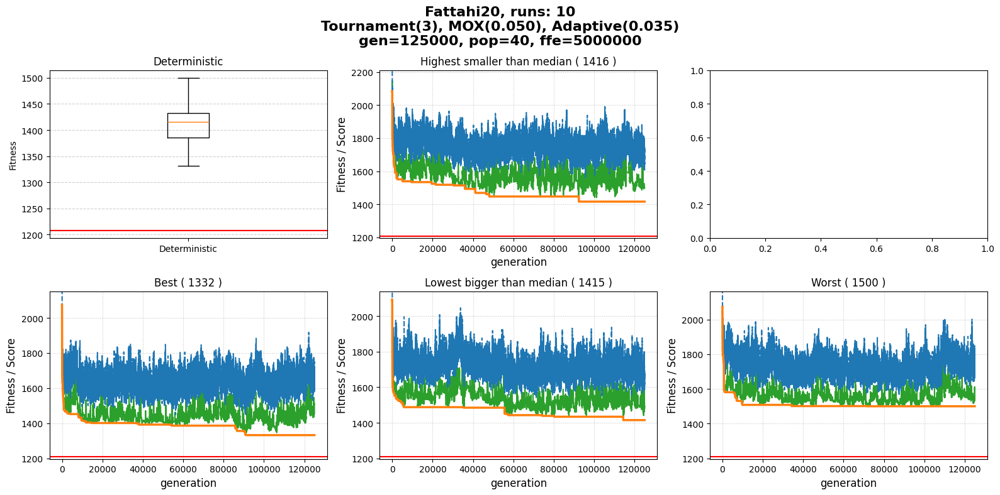

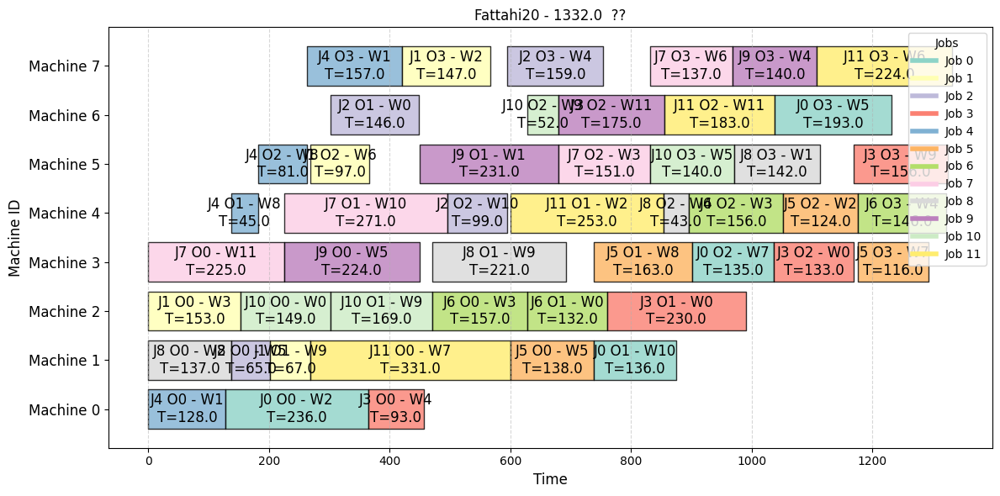

In [16]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +3,
    "machines_swap_weight": BASE_WEIGHT -2,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +3,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, selection_size=3)

In [ ]:
BASE_WEIGHT = 10
weights = {
    "sequence_swap_weight": BASE_WEIGHT +2,
    "machines_swap_weight": BASE_WEIGHT +0,
    "workers_swap_weight": BASE_WEIGHT +1,
    "sequence_move_weight": BASE_WEIGHT +2,
    "machines_replacement_weight": BASE_WEIGHT -5,
    "workers_replacement_weight": BASE_WEIGHT +1,
}

weight_sum = sum([val for val in weights.values()])
print(f"Sum of weights: {weight_sum}. Weights: {weights}")

mutation_weights_experiment(**weights, selection_size=4)

# END